In [179]:
# import those beauties

import pandas as pd
import geopandas as gpd
import geopy
from geopandas.tools import geocode
import contextily as ctx
from geopy.geocoders import Nominatim
import shapely
import matplotlib.pyplot as plt
import numpy as np
import math
import seaborn as sns
from geopandas import GeoDataFrame
from shapely.geometry import Polygon, Point
import pylab as pl
from shapely import wkt
import missingno as msno

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 50)

In [2]:
# read zri data for mapping by zri
zri_raw = pd.read_csv('/Users/trevorban/Desktop/zri-data/Zip_ZORI_AllHomesPlusMultifamily_SSA.csv')
zri = zri_raw.copy()

In [419]:
# read my file of target zipcodes
city_zip = pd.read_csv('/Users/trevorban/Desktop/zri-data/complete/city_zip.csv').drop(columns='Unnamed: 0')
city_zip.head()

,metro,zip
0,austin,78727
1,austin,78759
2,austin,78681
3,austin,78728
4,austin,78634


In [4]:
# giant texas roads shapefile.  Will later on select only relevant coordinates to fill each city with roads.
highway_sf = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/texas_highway/texas_highway.shp')

<AxesSubplot:>

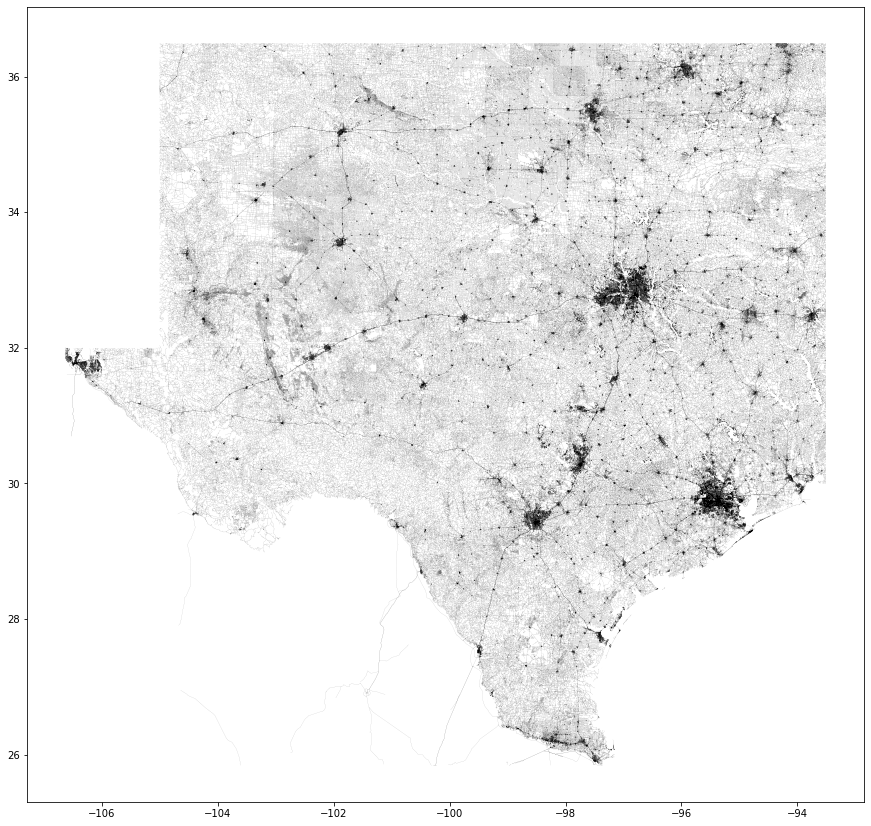

In [5]:
# beautiful
fig,ax = plt.subplots(figsize=(15,15))
highway_sf.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.05)

In [6]:
# not many usable features.  I'll have to just pull coordinates from geometry in order to select which to use.  
highway_sf.head()

,TYPE,NAME,ONEWAY,geometry
0,secondary,McNutt Rd,None,"LINESTRING (-106.54289 31.80148, -106.54433 31..."
1,residential,None,None,"LINESTRING (-106.63227 31.98552, -106.63193 31..."
2,residential,Man O War St,None,"LINESTRING (-106.63225 31.90800, -106.63129 31..."
3,residential,Country Club Rd,None,"LINESTRING (-106.63216 31.84619, -106.62635 31..."
4,residential,Crawford Rd,None,"LINESTRING (-106.62104 31.84665, -106.62128 31..."


In [7]:
# load the roads for each metro
sanan = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/sanan/shape/roads.shp')
dfw = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/dfw/shape/roads.shp')
houston = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/houston/shape/roads.shp')
austin = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/austin/shape/roads.shp')
elpaso = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/elpaso/shape/roads.shp')


In [8]:
sanan_water = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/sanan/shape/waterways.shp')
dfw_water = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/dfw/shape/waterways.shp')
houston_water = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/houston/shape/waterways.shp')
austin_water = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/austin/shape/waterways.shp')
elpaso_water = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/elpaso/shape/waterways.shp')


In [9]:
sanan_nat = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/sanan/shape/natural.shp')
dfw_nat = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/dfw/shape/natural.shp')
houston_nat = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/houston/shape/natural.shp')
austin_nat = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/austin/shape/natural.shp')
elpaso_nat = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/elpaso/shape/natural.shp')


In [10]:
sanan_nat_water = sanan_nat[sanan_nat['type']=='water']
dfw_nat_water = dfw_nat[dfw_nat['type']=='water']
houston_nat_water = houston_nat[houston_nat['type']=='water']
austin_nat_water = austin_nat[austin_nat['type']=='water']
elpaso_nat_water = elpaso_nat[elpaso_nat['type']=='water']

In [11]:
# https://gis.dallascityhall.com/shapezip.htm
# dallas
# dfw = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/dfw3/STREETS.shp')

In [12]:
# fig,ax = plt.subplots(figsize=(13,13))
# dfw.plot(ax=ax, zorder=2, legend=False, column='POSTAL_L', linewidth=.4, cmap='hsv')
# ax.grid(False)

In [13]:
# fig,ax = plt.subplots(figsize=(15,15))
# dfw.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=.4)

In [14]:
# test = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/untitled folder/Abstract/Abstract.shp')
# fig,ax = plt.subplots(figsize=(15,15))
# test.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=.4)

In [15]:
# https://regional-open-data-capcog.opendata.arcgis.com/
# test = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/houston_test/zipcode/ZIPCODE.shp')

In [16]:
# len(test.ZIPCODE.unique())

In [17]:
# fig,ax = plt.subplots(figsize=(15,15))
# test.plot(ax=ax, zorder=2, legend=True, linewidth=.4, column='ZIPCODE')

In [18]:
#houst = city_zip[city_zip['metro']=='houston']['zip']

In [19]:
# houst = test[test['PO_NAME'] == 'Houston']
# len(houst['ZIPCODE'].unique())

In [20]:
# houst['ZIPCODE'] = houst['ZIPCODE'].astype(str)

In [21]:
# houst

In [22]:
# fig,ax = plt.subplots(figsize=(15,15))
# houst.plot(ax=ax, zorder=2, legend=True, linewidth=.4, column='ZIPCODE')

# Get all zip code shapefiles

In [23]:
# import US zip codes
# https://data.houstontx.gov/dataset/zip-codes-in-the-region/resource/bb634e26-cb64-44e4-8b86-3a37d113886b

zips = gpd.read_file('/Users/trevorban/Downloads/tl_2019_us_zcta510/tl_2019_us_zcta510.shp')

In [24]:
zips

,ZCTA5CE10,GEOID10,CLASSFP10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry
0,43451,43451,B5,G6350,S,63484186,157689,+41.3183010,-083.6174935,"POLYGON ((-83.70873 41.32733, -83.70815 41.327..."
1,43452,43452,B5,G6350,S,121522304,13721730,+41.5157923,-082.9809454,"POLYGON ((-83.08698 41.53780, -83.08256 41.537..."
2,43456,43456,B5,G6350,S,9320975,1003775,+41.6318300,-082.8393923,"MULTIPOLYGON (((-82.83558 41.71082, -82.83515 ..."
3,43457,43457,B5,G6350,S,48004681,0,+41.2673301,-083.4274872,"POLYGON ((-83.49650 41.25371, -83.48382 41.253..."
4,43458,43458,B5,G6350,S,2573816,39915,+41.5304461,-083.2133648,"POLYGON ((-83.22229 41.53102, -83.22228 41.532..."
...,...,...,...,...,...,...,...,...,...,...
33139,84044,84044,B5,G6350,S,123283611,69912363,+40.7201095,-112.1549645,"POLYGON ((-112.26022 40.76909, -112.25333 40.7..."
33140,84045,84045,B5,G6350,S,52780589,105248,+40.3364908,-111.9111905,"MULTIPOLYGON (((-111.92421 40.17034, -111.9240..."
33141,84046,84046,B5,G6350,S,333205012,4460752,+40.9207693,-109.8310453,"POLYGON ((-110.00072 40.99745, -110.00036 40.9..."
33142,84047,84047,B5,G6350,S,16172461,0,+40.6152301,-111.8907499,"POLYGON ((-111.92141 40.62772, -111.92134 40.6..."


Text(0.5, 1.0, 'The US of A')

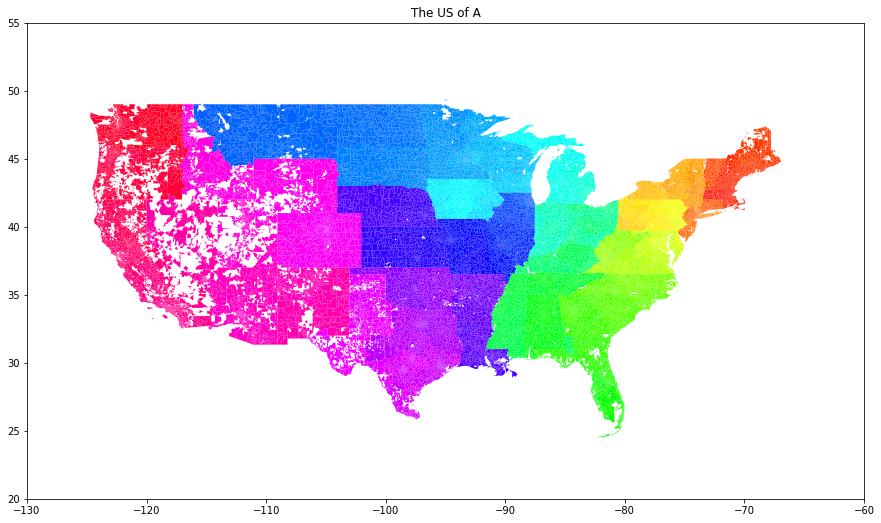

In [25]:
fig,ax = plt.subplots(figsize=(15,15))
zips.plot(ax=ax, zorder=2, cmap='hsv', column='GEOID10', legend=False)
plt.ylim(20, 55)
plt.xlim(-130, -60)
plt.title("The US of A")

In [26]:
# Other file I found...
# https://www.census.gov/geographies/mapping-files/time-series/geo/carto-boundary-file.2017.html
census_zip = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/cb_2017_us_zcta510_500k/cb_2017_us_zcta510_500k.shp')

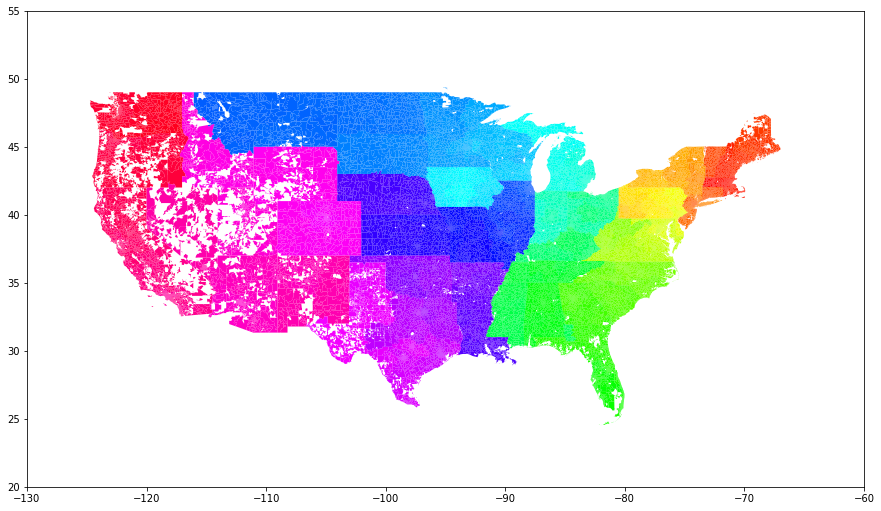

In [27]:
fig,ax = plt.subplots(figsize=(15,15))
census_zip.plot(ax=ax, zorder=2, legend=False, column = 'GEOID10', cmap='hsv')
plt.ylim(20, 55)
plt.xlim(-130, -60)
ax.grid(False)

# I guess they're the same dataset from two different sources

In [28]:
# https://www.census.gov/geographies/mapping-files/time-series/geo/carto-boundary-file.2017.html
# by county rather than zip
county_shp = gpd.read_file('/Users/trevorban/Downloads/cb_2017_48_cousub_500k/cb_2017_48_cousub_500k.shp')

In [29]:
county_shp

,STATEFP,COUNTYFP,COUSUBFP,COUSUBNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
0,48,071,92620,01939005,0600000US4807192620,4807192620,Mont Belvieu,22,307470737,40884198,"MULTIPOLYGON (((-94.71830 29.72885, -94.71721 ..."
1,48,421,93759,01939235,0600000US4842193759,4842193759,Stratford,22,986406512,147317,"POLYGON ((-102.16277 36.49790, -102.16246 36.5..."
2,48,077,90560,01938587,0600000US4807790560,4807790560,Byers-Petrolia,22,714631485,4086436,"POLYGON ((-98.42353 34.08284, -98.42041 34.082..."
3,48,093,90810,01938640,0600000US4809390810,4809390810,Comanche,22,1084775309,7187874,"POLYGON ((-98.92440 32.07802, -98.88707 32.096..."
4,48,455,91655,01938808,0600000US4845591655,4845591655,Groveton,22,521440094,16415702,"POLYGON ((-95.27093 30.91350, -95.26569 30.913..."
...,...,...,...,...,...,...,...,...,...,...,...
857,48,085,90100,01938495,0600000US4808590100,4808590100,Anna,22,340400615,4711471,"POLYGON ((-96.72725 33.40292, -96.65649 33.401..."
858,48,127,90140,01938503,0600000US4812790140,4812790140,Asherton,22,1638556561,8588583,"POLYGON ((-99.99408 28.21810, -99.99319 28.219..."
859,48,119,90840,01938646,0600000US4811990840,4811990840,Cooper,22,410135877,37212086,"POLYGON ((-95.76976 33.37794, -95.72907 33.377..."
860,48,225,93100,01939101,0600000US4822593100,4822593100,Porter Springs,22,464117061,2994002,"POLYGON ((-95.77535 31.12205, -95.77440 31.125..."


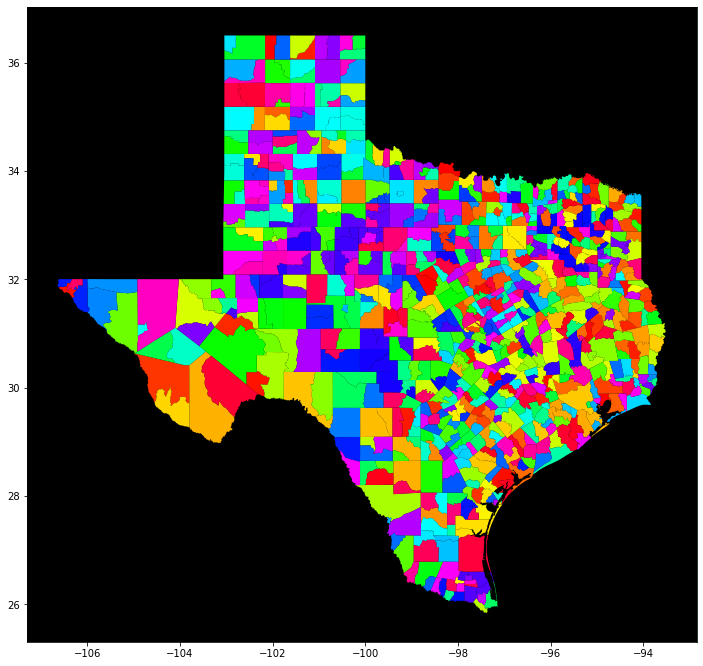

In [30]:
fig,ax = plt.subplots(figsize=(12,12))
county_shp.plot(ax=ax, zorder=2, legend=False, cmap='hsv')
ax.set(facecolor = "black")
ax.grid(False)

In [31]:
# https://www.census.gov/geographies/mapping-files/time-series/geo/carto-boundary-file.2017.html
# by census tract
census_shp = gpd.read_file('/Users/trevorban/Downloads/cb_2017_48_tract_500k/cb_2017_48_tract_500k.shp')


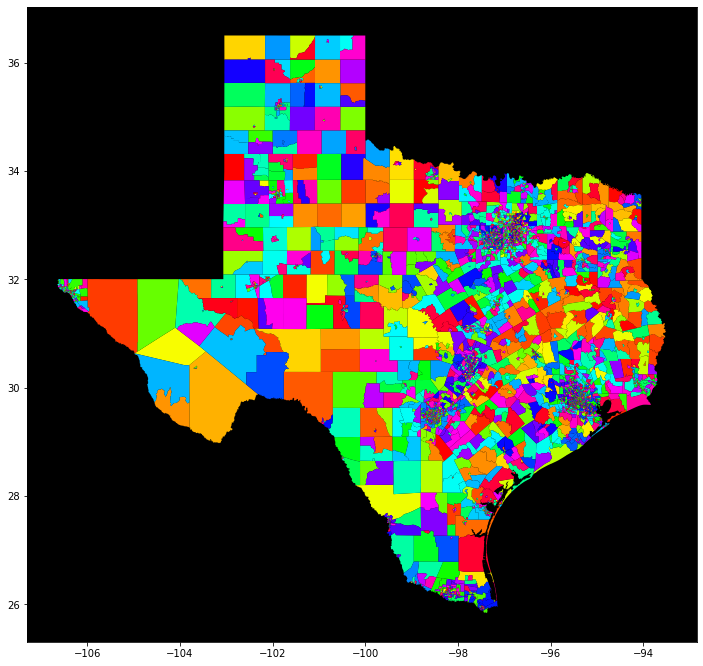

In [32]:
fig,ax = plt.subplots(figsize=(12,12))
census_shp.plot(ax=ax, zorder=2, legend=False, cmap='hsv')
ax.set(facecolor = "black")
ax.grid(False)

In [33]:
zips['GEOID10'] = zips['GEOID10'].astype(int)

In [34]:
zip_5 = zips[zips['GEOID10'].isin(city_zip['zip'])]

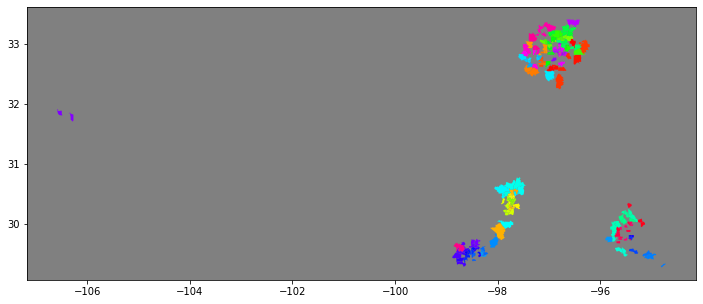

In [35]:
fig,ax = plt.subplots(figsize=(12,12))
zip_5.plot(ax=ax, zorder=2, legend=False, cmap='hsv')
ax.set(facecolor = "gray")
ax.grid(False)

In [36]:
zip_5.shape # we started with 215.  Which one is missing?

(214, 10)

In [190]:
zri_map = zri[['RegionName', '2021-07']]
zri_map.head()

,RegionName,2021-07
0,10025,2894.0
1,60657,1584.0
2,10023,2869.0
3,77494,1462.0
4,60614,1928.0


In [192]:
zri.T

0            1             2            3            4     \
RegionID           61639        84654         61637        91982        84616   
RegionName         10025        60657         10023        77494        60614   
SizeRank               1            2             3            4            5   
MsaName     New York, NY  Chicago, IL  New York, NY  Houston, TX  Chicago, IL   
2014-01           2889.0       1406.0        3003.0       1390.0       1692.0   
...                  ...          ...           ...          ...          ...   
2021-03           2909.0       1588.0        2894.0       1423.0       1922.0   
2021-04           2902.0       1587.0        2885.0       1432.0       1922.0   
2021-05           2899.0       1586.0        2880.0       1442.0       1924.0   
2021-06           2897.0       1585.0        2874.0       1452.0       1926.0   
2021-07           2894.0       1584.0        2869.0       1462.0       1928.0   

                   5             6            7            8            9     \
RegionID          91940         61616        91733        93144        84640   
RegionName        77449         10002        77084        79936        60640   
SizeRank              6             7            8            9           10   
MsaName     Houston, TX  New York, NY  Houston, TX  El Paso, TX  Chicago, IL   
2014-01          1202.0        2723.0       1058.0        887.0       1249.0   
...                 ...           ...          ...          ...          ...   
2021-03          1508.0        2789.0       1333.0       1017.0       1410.0   
2021-04          1522.0        2779.0       1342.0       1024.0       1408.0   
2021-05          1537.0        2774.0       1351.0       1030.0       1407.0   
2021-06          1552.0        2768.0       1361.0       1036.0       1406.0   
2021-07          1567.0        2763.0       1370.0       1043.0       1404.0   

                    10                 11            12             13    \
RegionID           62037              97564         61630          74101   
RegionName         11226              94109         10016          37013   
SizeRank              11                 14            16             17   
MsaName     New York, NY  San Francisco, CA  New York, NY  Nashville, TN   
2014-01           1705.0             2235.0        3126.0         1127.0   
...                  ...                ...           ...            ...   
2021-03           1984.0             2539.0        3021.0         1651.0   
2021-04           1977.0             2515.0        3009.0         1662.0   
2021-05           1970.0             2494.0        3003.0         1673.0   
2021-06           1964.0             2473.0        2996.0         1683.0   
2021-07           1958.0             2452.0        2990.0         1694.0   

                   14            15            16    \
RegionID          84646         62012         62087   
RegionName        60647         11201         11375   
SizeRank             19            20            22   
MsaName     Chicago, IL  New York, NY  New York, NY   
2014-01          1416.0        2819.0        1670.0   
...                 ...           ...           ...   
2021-03          1723.0        3035.0        2025.0   
2021-04          1723.0        3039.0        2021.0   
2021-05          1723.0        3047.0        2018.0   
2021-06          1723.0        3055.0        2015.0   
2021-07          1723.0        3063.0        2012.0   

                                          17               18    \
RegionID                                 96107            92271   
RegionName                               90250            78130   
SizeRank                                    23               24   
MsaName     Los Angeles-Long Beach-Anaheim, CA  San Antonio, TX   
2014-01                                 1110.0           1118.0   
...                                        ...              ...   
2021-03                                 175

In [38]:
# merge zri data to out 5 city zip codes
zip_5 = zip_5.merge(zri_map, how='inner', left_on='GEOID10', right_on='RegionName').rename(columns={'2021-07':'zri'})

In [39]:
# create lists of each city's zip codes
houston_zip = list(city_zip[city_zip['metro']=='houston']['zip'])
dfw_zip = list(city_zip[city_zip['metro']=='dfw']['zip'])
austin_zip = list(city_zip[city_zip['metro']=='austin']['zip'])
san_antonio_zip = list(city_zip[city_zip['metro']=='san_antonio']['zip'])
el_paso_zip = list(city_zip[city_zip['metro']=='el_paso']['zip'])

In [40]:
# Divide our zip_5 into each individual city
map_zip_houston = zip_5[zip_5['GEOID10'].isin(houston_zip)]
map_zip_dfw = zip_5[zip_5['GEOID10'].isin(dfw_zip)]
map_zip_austin = zip_5[zip_5['GEOID10'].isin(austin_zip)]
map_zip_san_antonio = zip_5[zip_5['GEOID10'].isin(san_antonio_zip)]
map_zip_el_paso = zip_5[zip_5['GEOID10'].isin(el_paso_zip)]


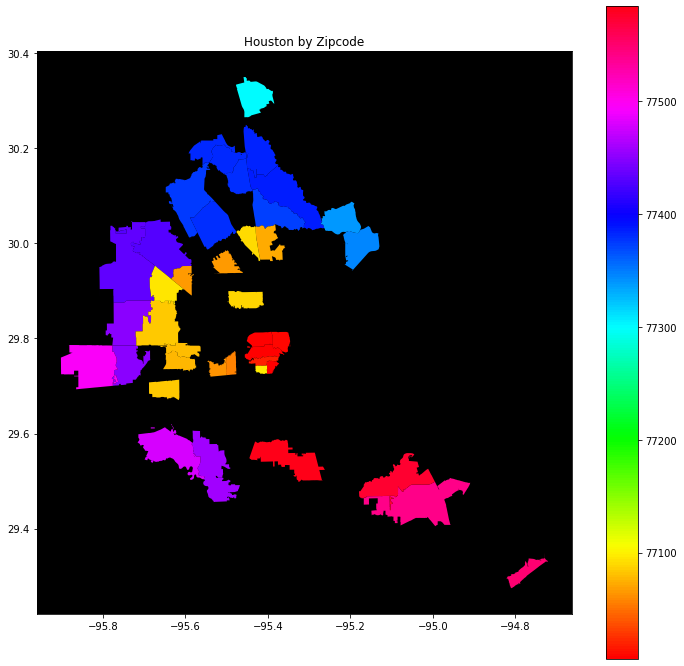

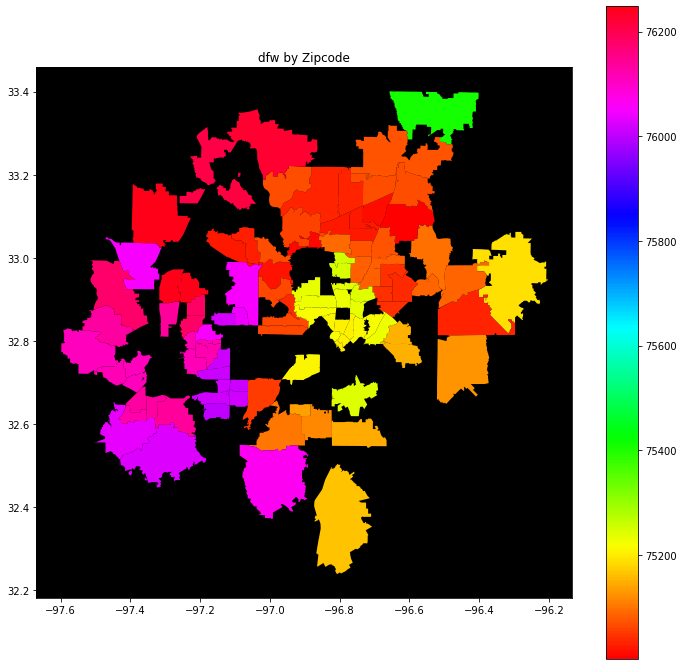

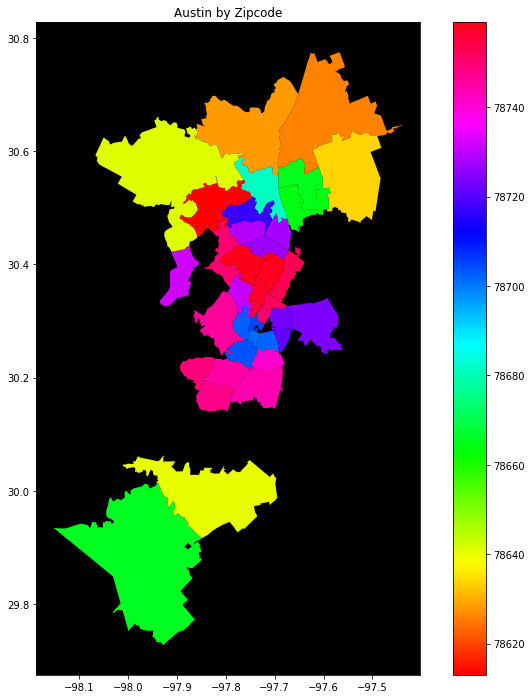

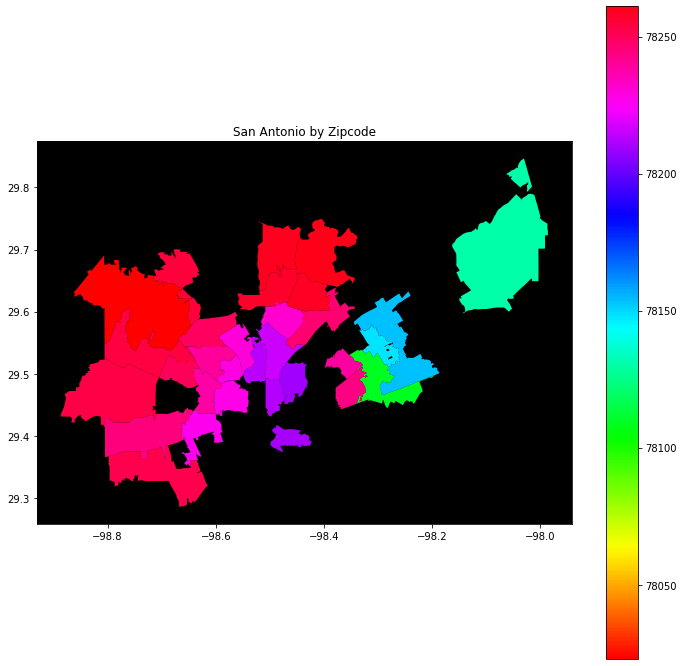

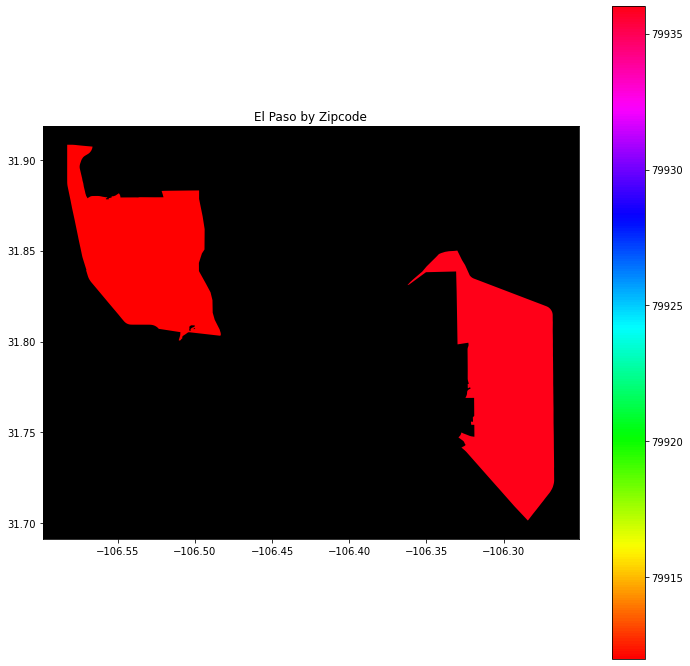

In [41]:
# coloring by zipcode alone

fig,ax = plt.subplots(figsize=(12,12))
map_zip_houston.plot(ax=ax, zorder=2, column='GEOID10', legend=True, cmap='hsv')
plt.title('Houston by Zipcode')
ax.set(facecolor = "black")
ax.grid(False)

fig,ax = plt.subplots(figsize=(12,12))
map_zip_dfw.plot(ax=ax, zorder=2, column='GEOID10', legend=True, cmap='hsv')
plt.title('dfw by Zipcode')
ax.set(facecolor = "black")
ax.grid(False)

fig,ax = plt.subplots(figsize=(12,12))
map_zip_austin.plot(ax=ax, zorder=2, column='GEOID10', legend=True, cmap='hsv')
plt.title('Austin by Zipcode')
ax.set(facecolor = "black")
ax.grid(False)

fig,ax = plt.subplots(figsize=(12,12))
map_zip_san_antonio.plot(ax=ax, zorder=2, column='GEOID10', legend=True, cmap='hsv')
plt.title('San Antonio by Zipcode')
ax.set(facecolor = "black")
ax.grid(False)

fig,ax = plt.subplots(figsize=(12,12))
map_zip_el_paso.plot(ax=ax, zorder=2, column='GEOID10', legend=True, cmap='hsv')
plt.title('El Paso by Zipcode')
ax.set(facecolor = "black")
ax.grid(False)

# There are several gaps.  This is due to zillow not reporting on all zip codes. 
# The empty zip codes will be filled later

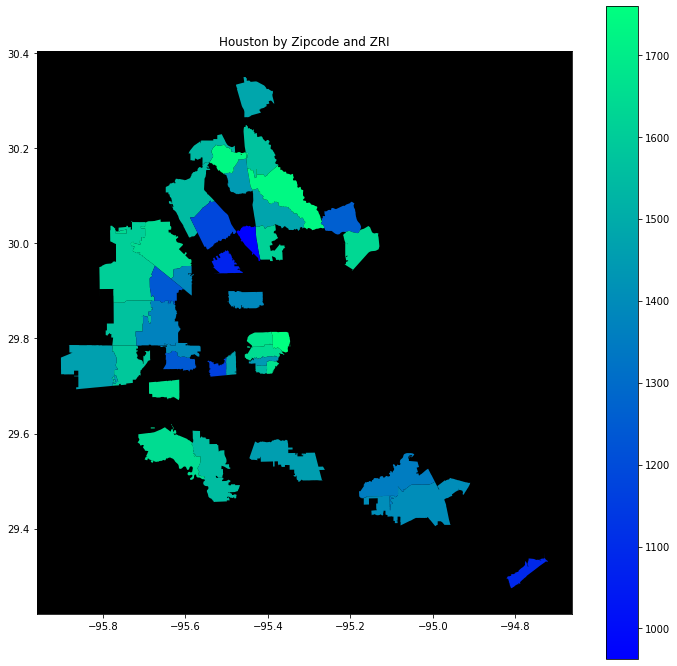

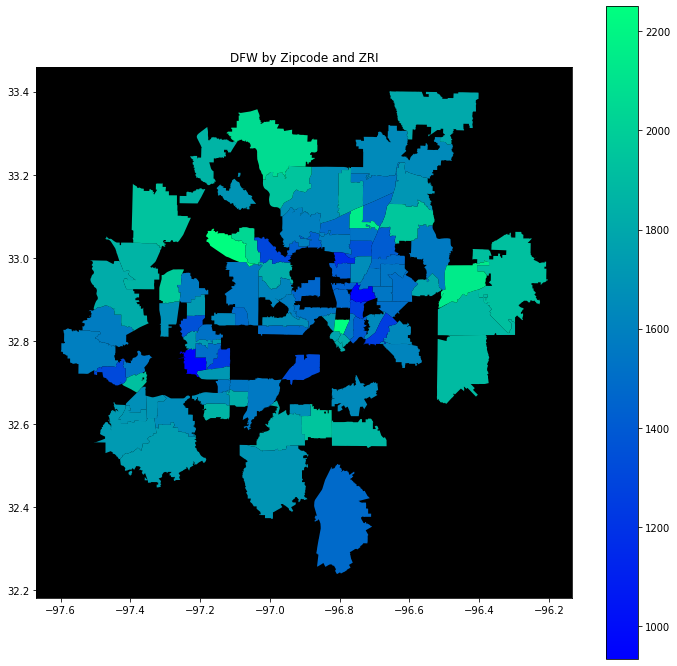

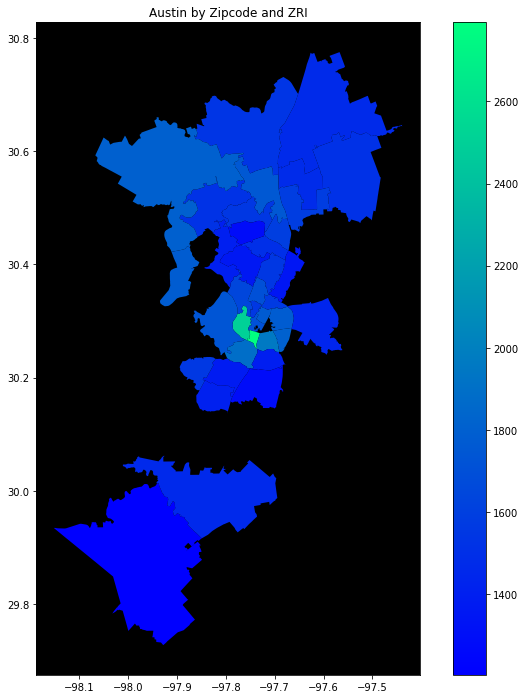

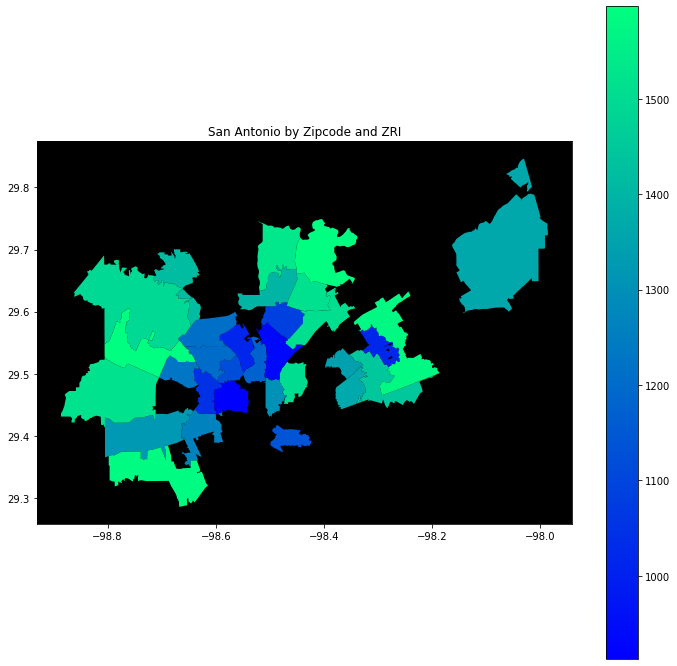

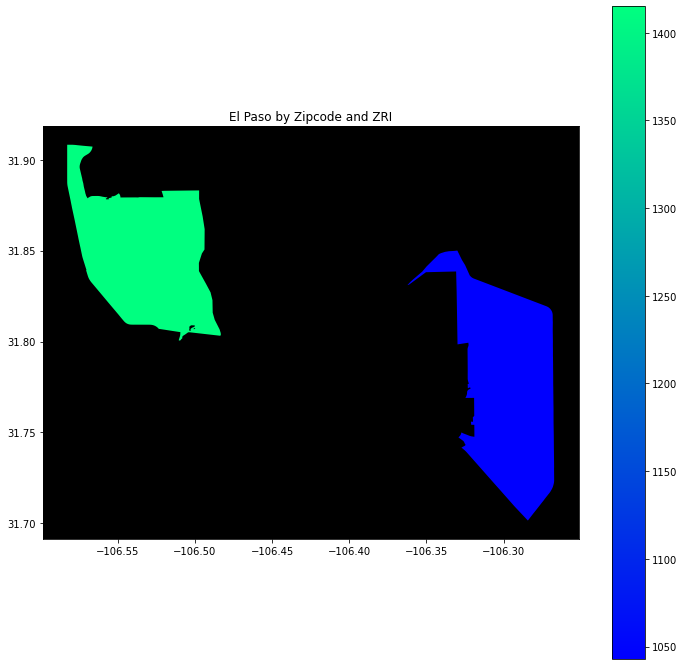

In [42]:
# coloring by zipcode and zri index

fig,ax = plt.subplots(figsize=(12,12))
map_zip_houston.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='winter')
plt.title('Houston by Zipcode and ZRI')
ax.set(facecolor = "black")
ax.grid(False)

fig,ax = plt.subplots(figsize=(12,12))
map_zip_dfw.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='winter')
plt.title('DFW by Zipcode and ZRI')
ax.set(facecolor = "black")
ax.grid(False)

fig,ax = plt.subplots(figsize=(12,12))
map_zip_austin.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='winter')
plt.title('Austin by Zipcode and ZRI')
ax.set(facecolor = "black")
ax.grid(False)

fig,ax = plt.subplots(figsize=(12,12))
map_zip_san_antonio.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='winter')
plt.title('San Antonio by Zipcode and ZRI')
ax.set(facecolor = "black")
ax.grid(False)

fig,ax = plt.subplots(figsize=(12,12))
map_zip_el_paso.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='winter')
plt.title('El Paso by Zipcode and ZRI')
ax.set(facecolor = "black")
ax.grid(False)


In [43]:
# create function for pulling roads from our large roadmap within a city's coordinates

def road_limit(df, xmin, xmax, ymin, ymax):
    df['x'] = df['geometry'].centroid.x
    df['y'] = df['geometry'].centroid.y
    df = df[df['x'] > xmin]
    df = df[df['x'] < xmax]
    df = df[df['y'] > ymin]
    df = df[df['y'] < ymax]
    return df

In [44]:
# Get roads from large roadmap, within each city coordinates (not the most computationally efficient)
austin_roads = road_limit(highway_sf, -98.2, -97.4, 29.7, 30.8)
dfw_roads = road_limit(highway_sf, -97.65, -96.2, 32.2, 33.45)
houston_roads = road_limit(highway_sf, -95.95, -94.9, 29.2, 30.4)
el_paso_roads = road_limit(highway_sf, -106.6, -106.25, 31.7, 31.92)
san_antonio_roads = road_limit(highway_sf, -98.95, -98, 29.25, 29.85)

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  after removing the cwd from sys.path.
/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  """
/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  after removing the cwd from sys.path.
/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Geometry i

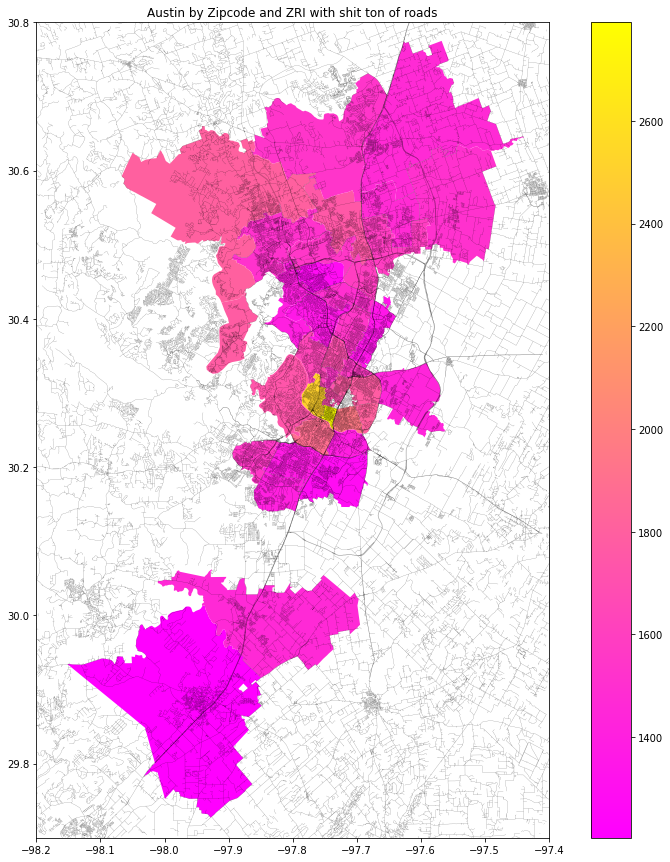

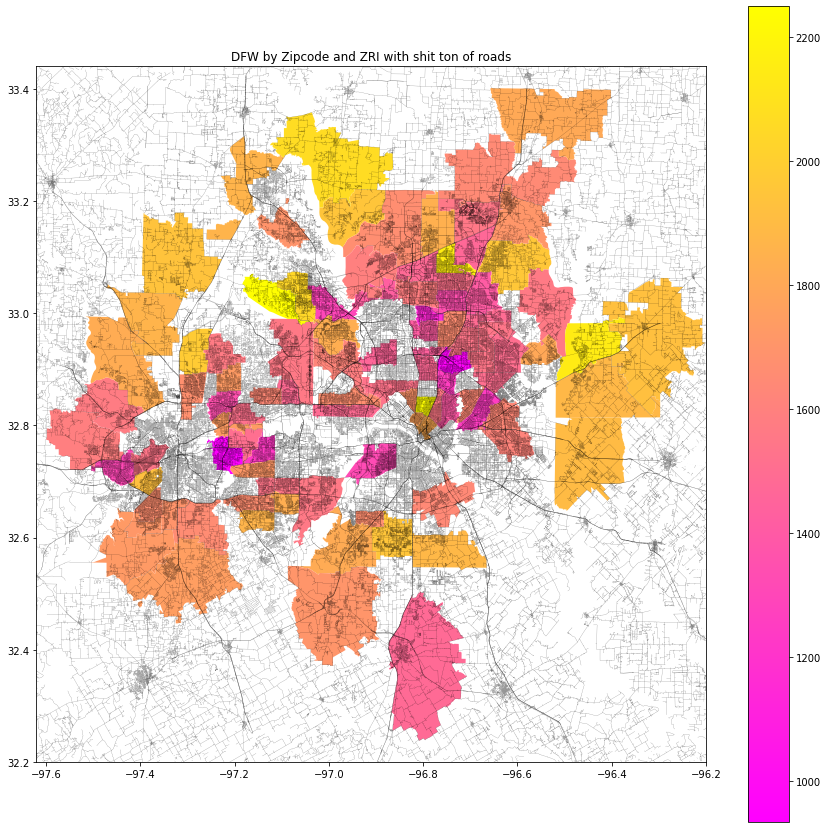

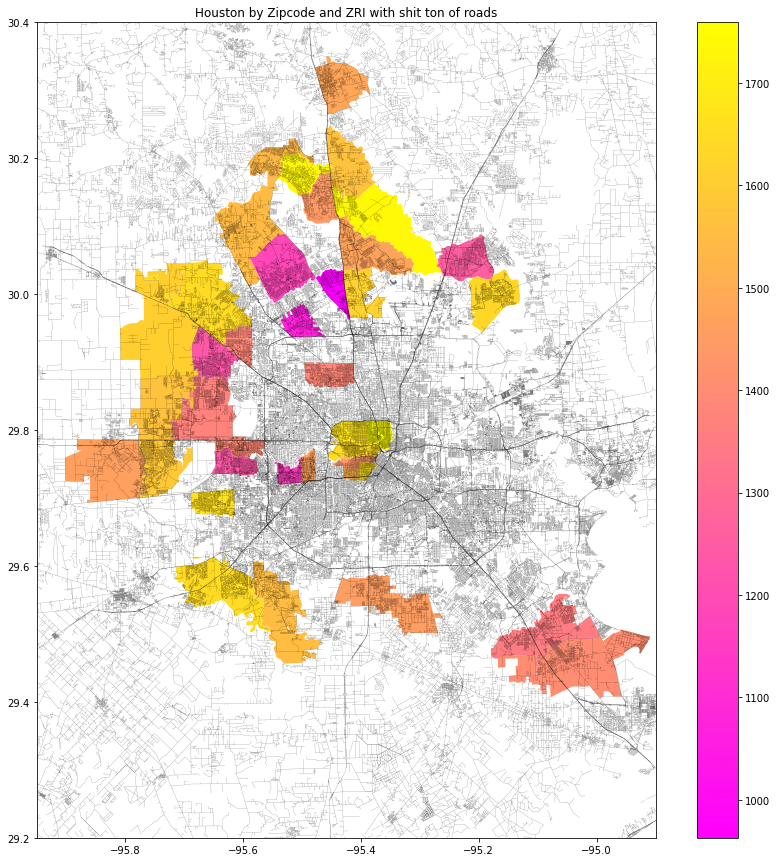

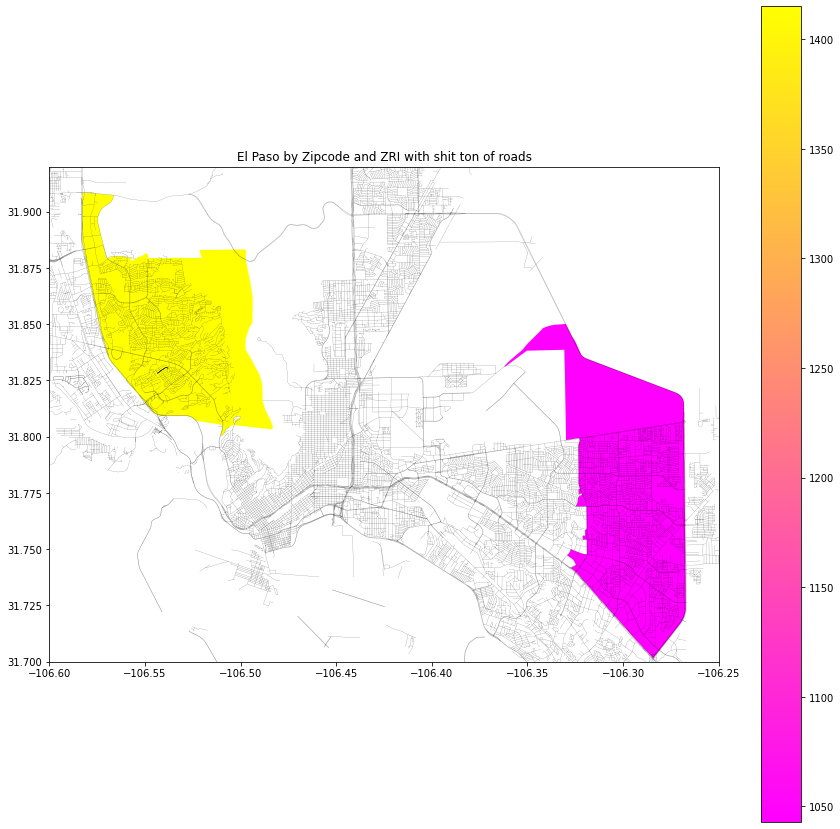

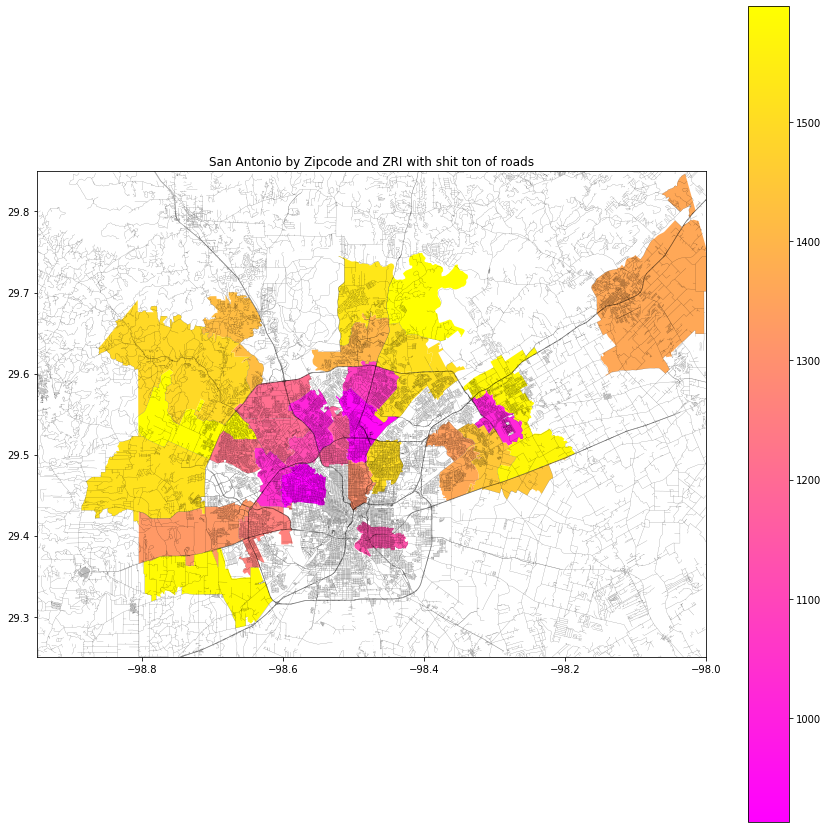

In [45]:
fig,ax = plt.subplots(figsize=(15,15))
map_zip_austin.plot(ax=ax, zorder=1, column='zri', legend=True, cmap='spring')
austin_roads.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.2, alpha=0.6)
plt.title('Austin by Zipcode and ZRI with shit ton of roads')
plt.ylim(29.7, 30.8)
plt.xlim(-98.2, -97.4)
ax.set(facecolor = "white")
ax.grid(False)

fig,ax = plt.subplots(figsize=(15,15))
map_zip_dfw.plot(ax=ax, zorder=1, column='zri', legend=True, cmap='spring')
dfw_roads.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.2, alpha=0.6)
plt.title('DFW by Zipcode and ZRI with shit ton of roads')
plt.ylim(32.2, 33.44)
plt.xlim(-97.62, -96.2)
ax.set(facecolor = "white")
ax.grid(False)

fig,ax = plt.subplots(figsize=(15,15))
map_zip_houston.plot(ax=ax, zorder=1, column='zri', legend=True, cmap='spring')
houston_roads.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.2, alpha=0.6)
plt.title('Houston by Zipcode and ZRI with shit ton of roads')
plt.ylim(29.2, 30.4)
plt.xlim(-95.95, -94.9)
ax.set(facecolor = "white")
ax.grid(False)

fig,ax = plt.subplots(figsize=(15,15))
map_zip_el_paso.plot(ax=ax, zorder=1, column='zri', legend=True, cmap='spring')
el_paso_roads.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.2, alpha=0.6)
plt.title('El Paso by Zipcode and ZRI with shit ton of roads')
plt.ylim(31.7, 31.92)
plt.xlim(-106.6, -106.25)
ax.set(facecolor = "white")
ax.grid(False)

fig,ax = plt.subplots(figsize=(15,15))
map_zip_san_antonio.plot(ax=ax, zorder=1, column='zri', legend=True, cmap='spring')
san_antonio_roads.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.2, alpha=0.6)
plt.title('San Antonio by Zipcode and ZRI with shit ton of roads')
plt.ylim(29.25, 29.85)
plt.xlim(-98.95, -98)
ax.set(facecolor = "white")
ax.grid(False)

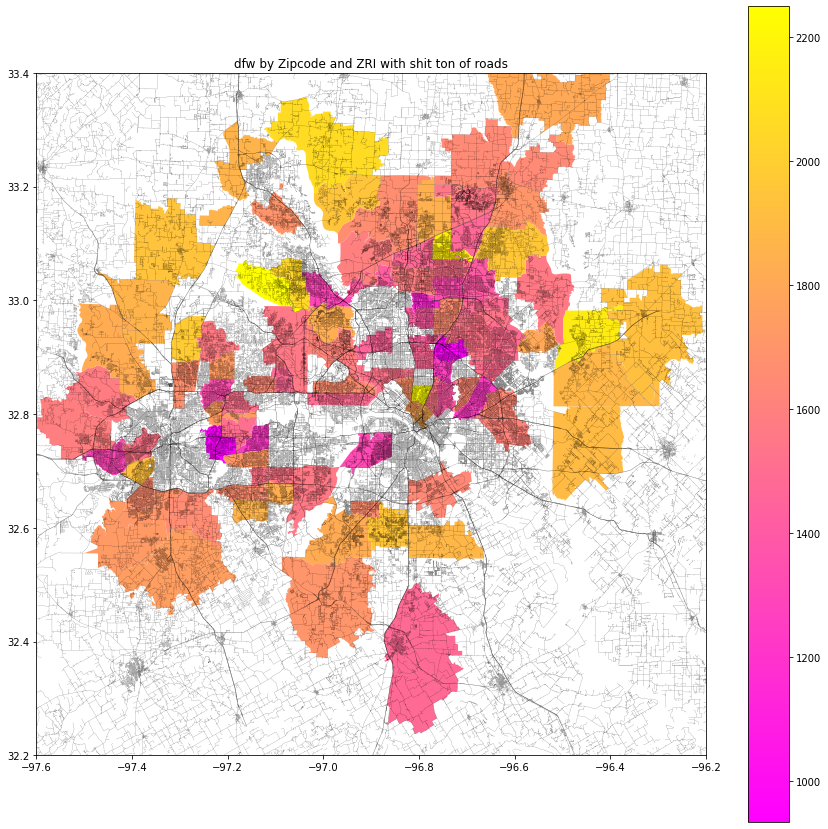

In [46]:
fig,ax = plt.subplots(figsize=(15,15))
map_zip_dfw.plot(ax=ax, zorder=1, column='zri', legend=True, cmap='spring')
dfw_roads.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.2, alpha=0.6)
plt.title('dfw by Zipcode and ZRI with shit ton of roads')
plt.ylim(32.2, 33.4)
plt.xlim(-97.6, -96.2)
ax.set(facecolor = "white")
ax.grid(False)

In [47]:
dfw_roads.TYPE.unique()

array(['residential', 'trunk', 'secondary', 'service', 'motorway',
       'unclassified', 'primary', 'track', 'trunk_link', 'motorway_link',
       'tertiary', 'primary_link', 'secondary_link', 'construction',
       'Hike/Bike Path', 'path', 'footway', 'cycleway',
       '820 Entrance Ramp', 'pedestrian', 'ford; footway', 'mo',
       'residential; secondary', 'fac', 'unclassified; residential',
       'primary; residential', 'road'], dtype=object)

In [48]:
dfw_limited_roads = dfw_roads[~dfw_roads["TYPE"].isin(['residential'])]

<AxesSubplot:>

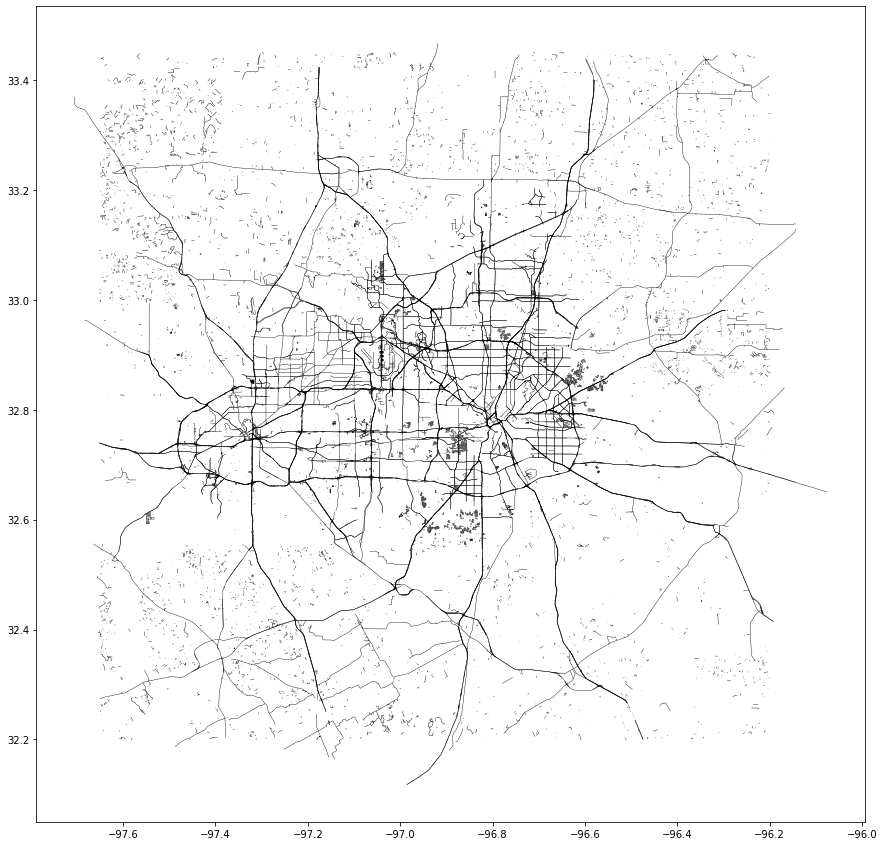

In [49]:
fig,ax = plt.subplots(figsize=(15,15))
dfw_limited_roads.plot(ax=ax, zorder=2, legend = True, color='black', linewidth=0.4, cmap='hsv')

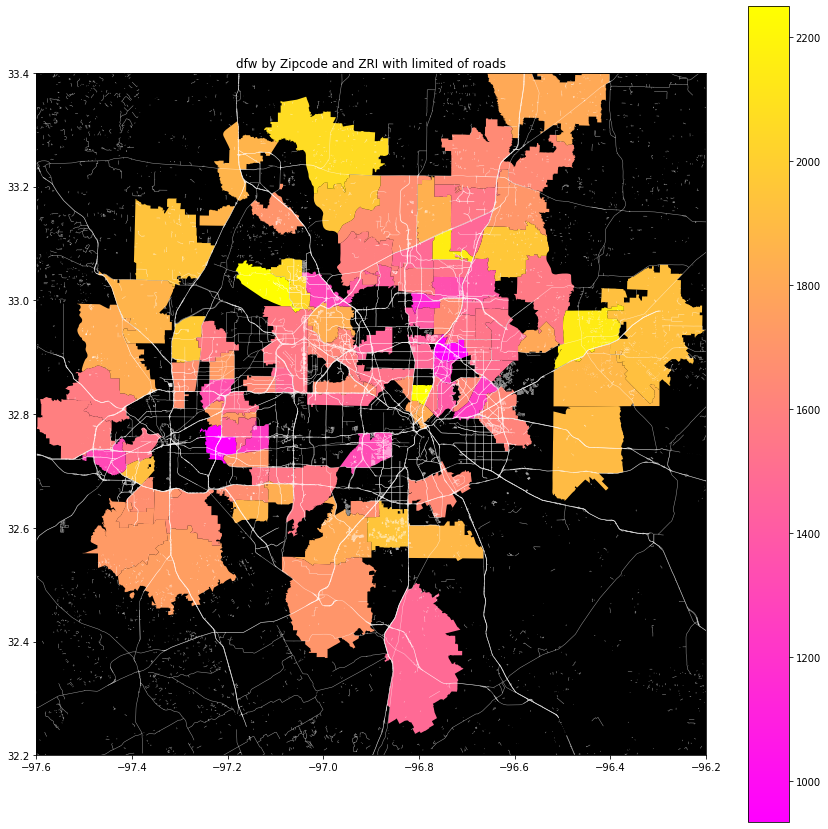

In [50]:
fig,ax = plt.subplots(figsize=(15,15))
map_zip_dfw.plot(ax=ax, zorder=1, column='zri', legend=True, cmap='spring')
dfw_limited_roads.plot(ax=ax, zorder=2, legend=True, color='white', linewidth=0.5, alpha=0.6)
plt.title('dfw by Zipcode and ZRI with limited of roads')
plt.ylim(32.2, 33.4)
plt.xlim(-97.6, -96.2)
ax.set(facecolor = "black")
ax.grid(False)

[None]

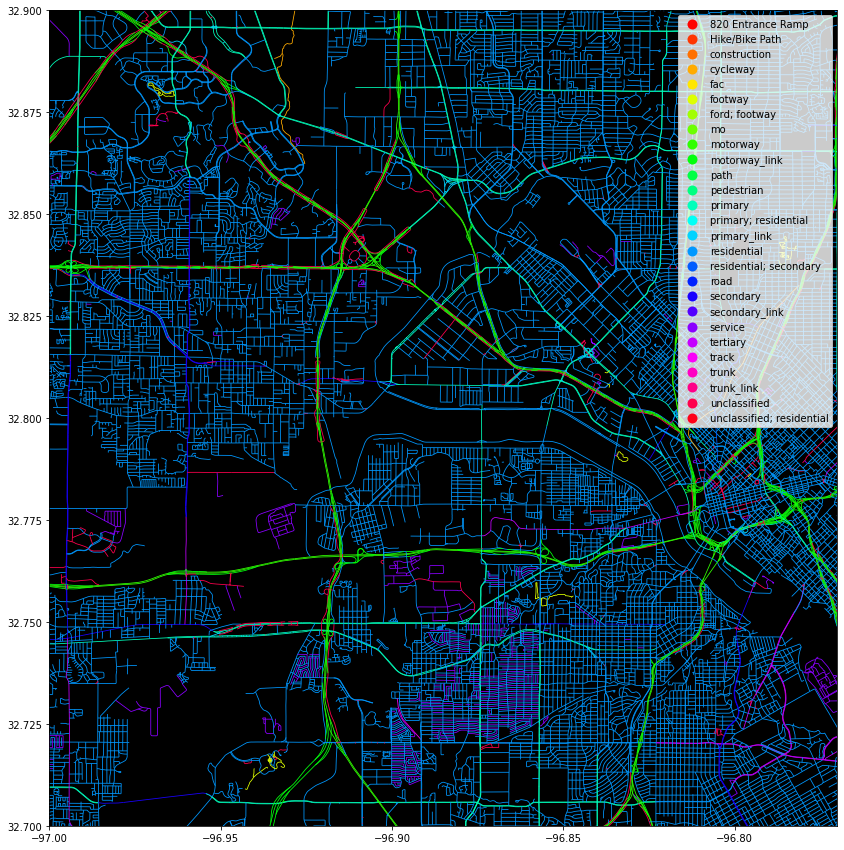

In [51]:
# experimenting with viewing by roadtypes.  I can limit the above roads to major roads (if it seems too crowded)
fig,ax = plt.subplots(figsize=(15,15))
dfw_roads.plot(ax=ax, zorder=2, legend = True, column='TYPE', linewidth=0.8, cmap='hsv')
plt.ylim(32.7, 32.9)
plt.xlim(-97.0, -96.77)
ax.set(facecolor = "black")


## fill in zips that aren't included in zillow df

In [52]:
dfw_zip = [75201, 75202, 75203, 75204, 75205, 75206, 75207, 75208, 75209, 75210, 75211, 75212, 75214, 75215, 75216, 75217, 75218, 75219, 75220, 75221, 75222, 75223, 75224, 75225, 75226, 75227, 75228, 75229, 75230, 75231, 75232, 75233, 75234, 75235, 75236, 75237, 75238, 75239, 75240, 75241, 75242, 75243, 75244, 75245, 75246, 75247, 75248, 75249, 75250, 75251, 75252, 75253, 75258, 75260, 75261, 75262, 75263, 75264, 75265, 75266, 75267, 75270, 75275, 75277, 75283, 75284, 75285, 75286, 75287, 75294, 75295, 75301, 75303, 75310, 75312, 75313, 75315, 75320, 75323, 75326, 75336, 75339, 75342, 75346, 75350, 75353, 75354, 75355, 75356, 75357, 75359, 75360, 75363, 75364, 75367, 75368, 75370, 75371, 75372, 75373, 75374, 75376, 75378, 75379, 75380, 75381, 75382, 75386, 75387, 75388, 75389, 75390, 75391, 75392, 75393, 75394, 75395, 75396, 75397, 75398]

sanan_zip = [78023, 78056, 78073, 78109, 78112, 78154, 78201, 78202, 78203, 78204, 78205, 78207, 78208, 78209, 78210, 78211, 78212, 78213, 78214, 78215, 78216, 78217, 78218, 78219, 78220, 78221, 78222, 78223, 78224, 78225, 78226, 78227, 78228, 78229, 78230, 78231, 78232, 78233, 78234, 78235, 78236, 78237, 78238, 78239, 78240, 78242, 78243, 78244, 78245, 78247, 78248, 78249, 78250, 78251, 78252, 78253, 78254, 78255, 78256, 78257, 78258, 78259, 78260, 78263, 78264, 78266]

houston_zip = [77002, 77003, 77004, 77005, 77006, 77007, 77008, 77009, 77010, 77011, 77012, 77013, 77014, 77015, 77016, 77017, 77018, 77019, 77020, 77021, 77022, 77023, 77024, 77025, 77026, 77027, 77028, 77029, 77030, 77031, 77032, 77033, 77034, 77035, 77036, 77037, 77038, 77039, 77040, 77041, 77042, 77043, 77044, 77045, 77046, 77047, 77048, 77049, 77050, 77051, 77053, 77054, 77055, 77056, 77057, 77058, 77059, 77060, 77061, 77062, 77063, 77064, 77065, 77066, 77067, 77068, 77069, 77070, 77071, 77072, 77073, 77074, 77075, 77076, 77077, 77078, 77079, 77080, 77081, 77082, 77083, 77084, 77085, 77086, 77087, 77088, 77089, 77090, 77091, 77092, 77093, 77094, 77095, 77096, 77098, 77099, 77201, 77336, 77338, 77339, 77345, 77346, 77357, 77365, 77373, 77375, 77377, 77379, 77386, 77388, 77396, 77401, 77406, 77407, 77429, 77433, 77447, 77449, 77450, 77477, 77478, 77484, 77489, 77493, 77494, 77498, 77503, 77504, 77506, 77520, 77530, 77532, 77536, 77546, 77547, 77571, 77587, 77598]

austin_zip = [78610, 78613, 78617, 78641, 78652, 78653, 78660, 78664, 78681, 78701, 78702, 78703, 78704, 78705, 78712, 78717, 78719, 78721, 78722, 78723, 78724, 78725, 78726, 78727, 78728, 78729, 78730, 78731, 78732, 78733, 78734, 78735, 78736, 78737, 78738, 78739, 78741, 78742, 78744, 78745, 78746, 78747, 78748, 78749, 78750, 78751, 78752, 78753, 78754, 78756, 78757, 78758, 78759]

elpaso_zip = [79821, 79835, 79901, 79902, 79903, 79904, 79905, 79906, 79907, 79908, 79911, 79912, 79915, 79920, 79922, 79924, 79925, 79927, 79928, 79930, 79932, 79934, 79935, 79936, 79938, 88063]

In [53]:
zips

,ZCTA5CE10,GEOID10,CLASSFP10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry
0,43451,43451,B5,G6350,S,63484186,157689,+41.3183010,-083.6174935,"POLYGON ((-83.70873 41.32733, -83.70815 41.327..."
1,43452,43452,B5,G6350,S,121522304,13721730,+41.5157923,-082.9809454,"POLYGON ((-83.08698 41.53780, -83.08256 41.537..."
2,43456,43456,B5,G6350,S,9320975,1003775,+41.6318300,-082.8393923,"MULTIPOLYGON (((-82.83558 41.71082, -82.83515 ..."
3,43457,43457,B5,G6350,S,48004681,0,+41.2673301,-083.4274872,"POLYGON ((-83.49650 41.25371, -83.48382 41.253..."
4,43458,43458,B5,G6350,S,2573816,39915,+41.5304461,-083.2133648,"POLYGON ((-83.22229 41.53102, -83.22228 41.532..."
...,...,...,...,...,...,...,...,...,...,...
33139,84044,84044,B5,G6350,S,123283611,69912363,+40.7201095,-112.1549645,"POLYGON ((-112.26022 40.76909, -112.25333 40.7..."
33140,84045,84045,B5,G6350,S,52780589,105248,+40.3364908,-111.9111905,"MULTIPOLYGON (((-111.92421 40.17034, -111.9240..."
33141,84046,84046,B5,G6350,S,333205012,4460752,+40.9207693,-109.8310453,"POLYGON ((-110.00072 40.99745, -110.00036 40.9..."
33142,84047,84047,B5,G6350,S,16172461,0,+40.6152301,-111.8907499,"POLYGON ((-111.92141 40.62772, -111.92134 40.6..."


In [54]:
# full zip codes for each metro
houston_full_zips = zips[zips['GEOID10'].isin(houston_zip)]
dfw_full_zips = zips[zips['GEOID10'].isin(dfw_zip)]
sanan_full_zips = zips[zips['GEOID10'].isin(sanan_zip)]
austin_full_zips = zips[zips['GEOID10'].isin(austin_zip)]
elpaso_full_zips = zips[zips['GEOID10'].isin(elpaso_zip)]

In [55]:
# Create boundary geometry (maybe there's a simler way to do this?)
# houston_boundary = houston_full_zips.copy()
# dfw_boundary = dfw_full_zips.copy()
# sanan_boundary = sanan_full_zips.copy()
# austin_boundary = austin_full_zips.copy()
# elpaso_boundary = elpaso_full_zips.copy()

# houston_boundary['geometry'] = houston_full_zips['geometry'].boundary
# dfw_boundary['geometry'] = dfw_full_zips['geometry'].boundary
# sanan_boundary['geometry'] = sanan_full_zips['geometry'].boundary
# austin_boundary['geometry'] = austin_full_zips['geometry'].boundary
# elpaso_boundary['geometry'] = elpaso_full_zips['geometry'].boundary

In [56]:
# remove zip codes already included in zillow data
houston_half_zips = houston_full_zips[~houston_full_zips['GEOID10'].isin(map_zip_houston['GEOID10'])]
dfw_half_zips = dfw_full_zips[~dfw_full_zips['GEOID10'].isin(map_zip_dfw['GEOID10'])]
sanan_half_zips = sanan_full_zips[~sanan_full_zips['GEOID10'].isin(map_zip_san_antonio['GEOID10'])]
austin_half_zips = austin_full_zips[~austin_full_zips['GEOID10'].isin(map_zip_austin['GEOID10'])]
elpaso_half_zips = elpaso_full_zips[~elpaso_full_zips['GEOID10'].isin(map_zip_el_paso['GEOID10'])]

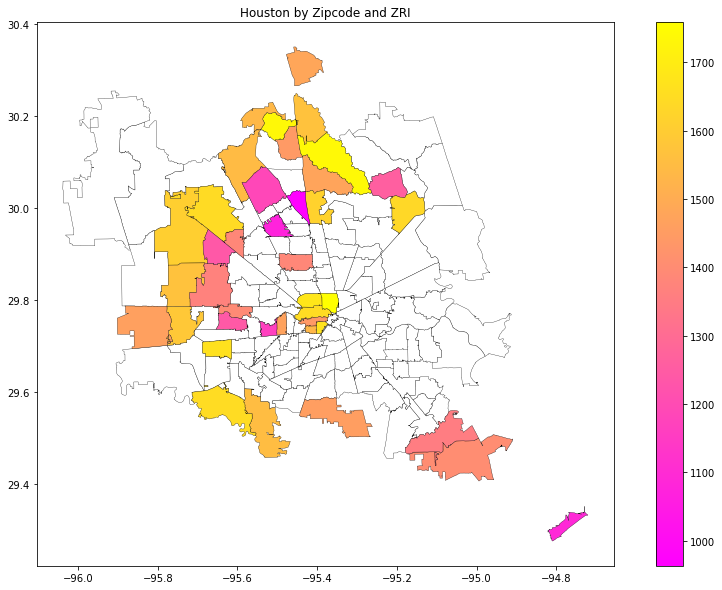

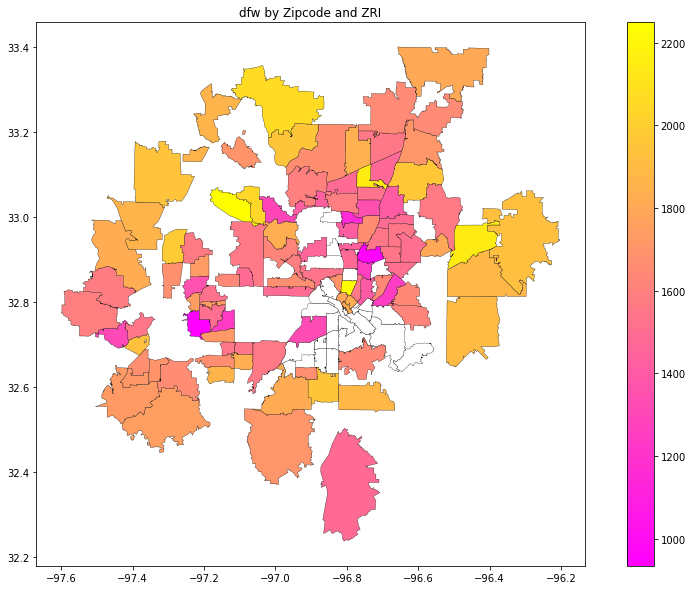

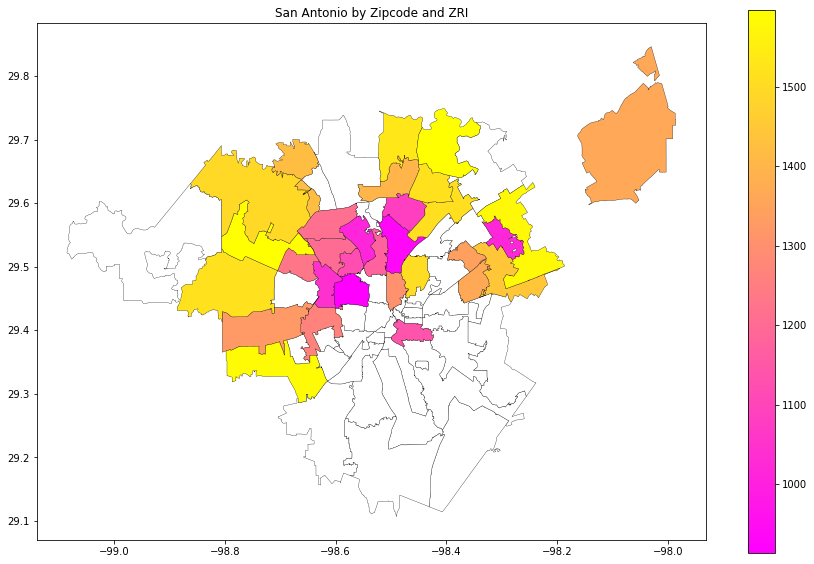

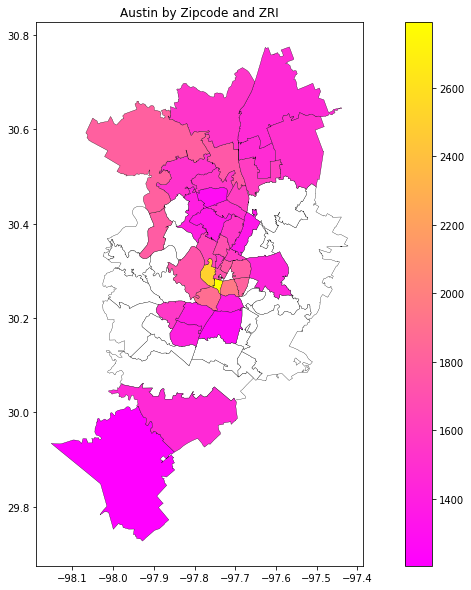

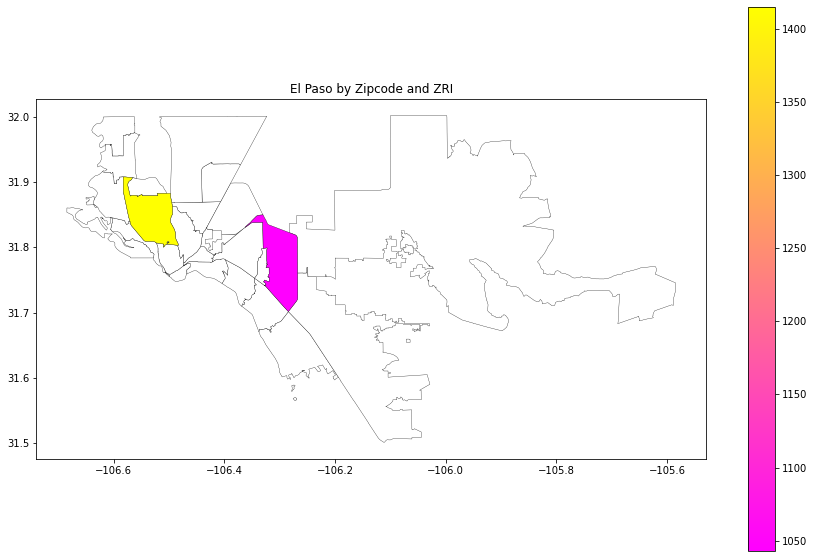

In [57]:
# filled in zip codes 
fig,ax = plt.subplots(figsize=(15, 10))
map_zip_houston.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='spring', edgecolor='black', linewidth=0.3)
houston_half_zips.plot(ax=ax, zorder=1, legend=True, color='white', edgecolor='black', linewidth=0.3)
plt.title('Houston by Zipcode and ZRI')
ax.set(facecolor = "white")
ax.grid(False)

fig,ax = plt.subplots(figsize=(15, 10))
map_zip_dfw.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='spring', edgecolor='black', linewidth=0.3)
dfw_half_zips.plot(ax=ax, zorder=1, legend=True, color='white', edgecolor='black', linewidth=0.3)
plt.title('dfw by Zipcode and ZRI')
ax.set(facecolor = "white")
ax.grid(False)

fig,ax = plt.subplots(figsize=(15, 10))
map_zip_san_antonio.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='spring', edgecolor='black', linewidth=0.3)
sanan_half_zips.plot(ax=ax, zorder=1, legend=True, color='white', edgecolor='black', linewidth=0.3)
plt.title('San Antonio by Zipcode and ZRI')
ax.set(facecolor = "white")
ax.grid(False)

fig,ax = plt.subplots(figsize=(15, 10))
map_zip_austin.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='spring', edgecolor='black', linewidth=0.3)
austin_half_zips.plot(ax=ax, zorder=1, legend=True, color='white', edgecolor='black', linewidth=0.3)
plt.title('Austin by Zipcode and ZRI')
ax.set(facecolor = "white")
ax.grid(False)

fig,ax = plt.subplots(figsize=(15, 10))
map_zip_el_paso.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='spring', edgecolor='black', linewidth=0.3)
elpaso_half_zips.plot(ax=ax, zorder=1, legend=True, color='white', edgecolor='black', linewidth=0.3)
plt.title('El Paso by Zipcode and ZRI')
ax.set(facecolor = "white")
ax.grid(False)

# Not great results

(-98.2, -97.4)

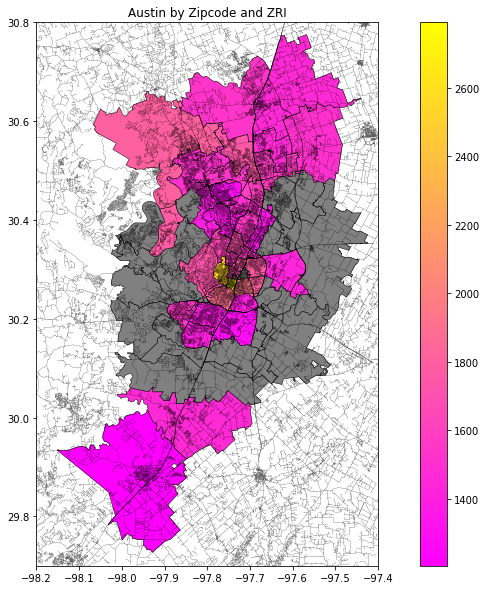

In [58]:
# all together, it could look something like this
fig,ax = plt.subplots(figsize=(15, 10))
map_zip_austin.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='spring', edgecolor='black', linewidth=0.5)
austin_roads.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.2)
austin_half_zips.plot(ax=ax, zorder=1, legend=True, color='gray', edgecolor='black', linewidth=0.5)
plt.title('Austin by Zipcode and ZRI')
ax.set(facecolor = "white")
ax.grid(False)
plt.ylim(29.7, 30.8)
plt.xlim(-98.2, -97.4)

In [59]:
austin_roads_less = austin_roads[~austin_roads["TYPE"].isin(['residential'])]

(-98.2, -97.4)

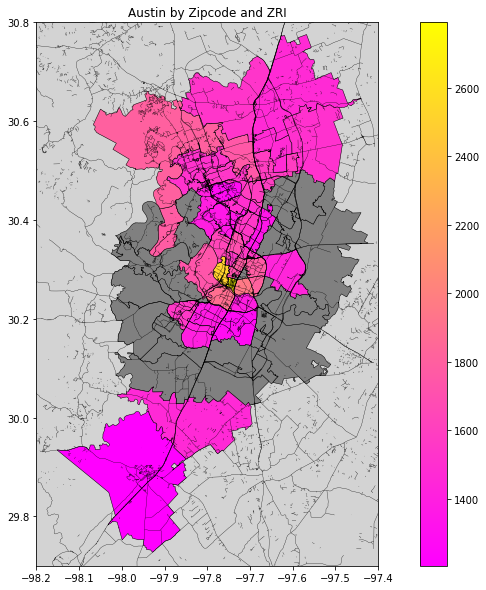

In [60]:
# or with reduced roads
fig,ax = plt.subplots(figsize=(15, 10))
map_zip_austin.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='spring', edgecolor='black', linewidth=0.5)
austin_roads_less.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.3)
austin_half_zips.plot(ax=ax, zorder=1, legend=True, color='gray', edgecolor='black', linewidth=0.5)
plt.title('Austin by Zipcode and ZRI')
ax.set(facecolor = "#D3D3D3")
ax.grid(False)
plt.ylim(29.7, 30.8)
plt.xlim(-98.2, -97.4)
# way too busy, no longer insightful.  Roads don't seem to add anything other than needless complexity

(-98.2, -97.4)

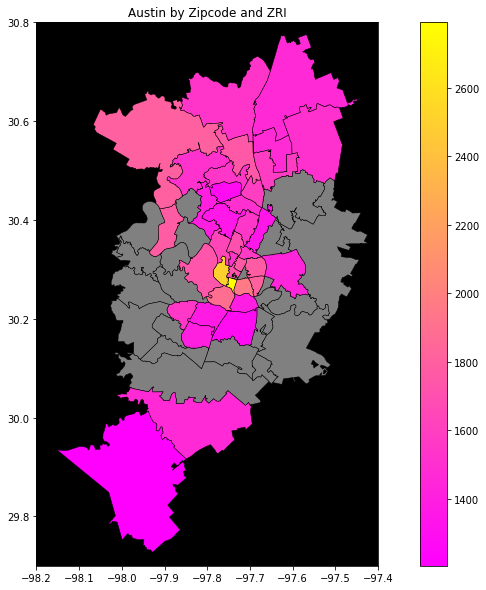

In [61]:
fig,ax = plt.subplots(figsize=(15, 10))
map_zip_austin.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='spring', edgecolor='black', linewidth=0.5)
#austin_roads_less.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.3)
austin_half_zips.plot(ax=ax, zorder=1, legend=True, color='gray', edgecolor='black', linewidth=0.5)
plt.title('Austin by Zipcode and ZRI')
ax.set(facecolor = "black")
ax.grid(False)
plt.ylim(29.7, 30.8)
plt.xlim(-98.2, -97.4)


In [62]:
apoints = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/austin/shape/points.shp')
abuildings = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/austin/shape/buildings.shp')

In [63]:
abuildings['type'].unique()

array(['cinema', 'government', 'university', None, 'museum', 'parking',
       'school', 'stadium seating', 'restaurant', 'retail', 'commercial',
       'fast_food', 'bank', 'roof', 'fuel', 'place_of_worship', 'hotel',
       'post_office', 'police', 'clinic', 'car_wash', 'house', 'church',
       'library', 'fire_station', 'townhall', 'pharmacy', 'barn',
       'office', 'garage', 'community_centre', 'college', 'arts_centre',
       'shop', 'information', 'toilets', 'cafe', 'stadium',
       'events_venue', 'industrial', 'car_rental', 'kindergarten',
       'storage_tank', 'motel', 'apartments', 'stable', 'covered area',
       'public', 'undefined', 'warehouse', 'cafeteria', 'shelter',
       'doctors', 'school;public_bu', 'veterinary', 'public_building',
       'pub', 'bar', 'dormitory', 'hospital', 'construction', 'childcare',
       'service', 'detached', 'greenhouse', 'vehicle_inspecti',
       'bus_station', 'Bing', 'train_station', 'residential',
       'demountable', 'silo', '

In [64]:
# plot some cafes for the hell of it
cafe = abuildings[abuildings['type']=='cafe']
starbs = cafe[cafe['name']=='Starbucks']

In [65]:
starbs['geometry'] = starbs['geometry'].centroid

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  """Entry point for launching an IPython kernel.
/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


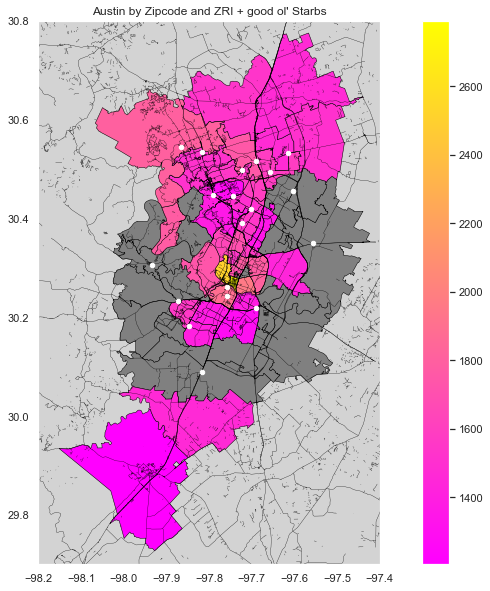

In [398]:
fig,ax = plt.subplots(figsize=(15, 10))
map_zip_austin.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='spring', edgecolor='black', linewidth=0.5)
austin_roads_less.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.3)
starbs.plot(ax=ax, zorder=4, markersize=20, color='white')
austin_half_zips.plot(ax=ax, zorder=1, legend=True, color='gray', edgecolor='black', linewidth=0.5)
plt.title("Austin by Zipcode and ZRI + good ol' Starbs" )
ax.set(facecolor = "#D3D3D3")
ax.grid(False)
plt.ylim(29.7, 30.8)
plt.xlim(-98.2, -97.4);


# EDGECOLOR!! no need for computing boundaries, duh

In [67]:
# stripclub = abuildings[abuildings['type']=='stripclub']
# stripclub['geometry'] = stripclub['geometry'].centroid

In [68]:
# fig,ax = plt.subplots(figsize=(15, 10))
# map_zip_austin.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='spring', edgecolor='black', linewidth=0.5)
# # austin_boundary.plot(ax=ax, zorder=3, color='black', linewidth=0.4)
# # austin_roads_less.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.3)
# stripclub.plot(ax=ax, zorder=5, markersize=2000, marker='*', color='white')
# austin_half_zips.plot(ax=ax, zorder=1, legend=True, color='gray', edgecolor='black', linewidth=0.5)
# plt.title('Austin by Zipcode and ZRI')
# ax.set(facecolor = "#D3D3D3")
# ax.grid(False)
# plt.ylim(29.7, 30.8)
# plt.xlim(-98.2, -97.4)

In [69]:
def zip_limit(df, xmin, xmax, ymin, ymax):
    df['x'] = df['geometry'].centroid.x
    df['y'] = df['geometry'].centroid.y
    df = df[df['x'] > xmin]
    df = df[df['x'] < xmax]
    df = df[df['y'] > ymin]
    df = df[df['y'] < ymax]
    return df

In [70]:
dfw_zip_limit = zip_limit(zips, -97.65, -96.2, 32.2, 33.45)

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  
/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  This is separate from the ipykernel package so we can avoid doing imports until


In [413]:
dfw_roads['TYPE'].unique()

array(['residential', 'trunk', 'secondary', 'service', 'motorway',
       'unclassified', 'primary', 'track', 'trunk_link', 'motorway_link',
       'tertiary', 'primary_link', 'secondary_link', 'construction',
       'Hike/Bike Path', 'path', 'footway', 'cycleway',
       '820 Entrance Ramp', 'pedestrian', 'ford; footway', 'mo',
       'residential; secondary', 'fac', 'unclassified; residential',
       'primary; residential', 'road'], dtype=object)

In [415]:
a = dfw_roads[dfw_roads['TYPE'].isin(['primary', 'secondary', 'motorway'])]

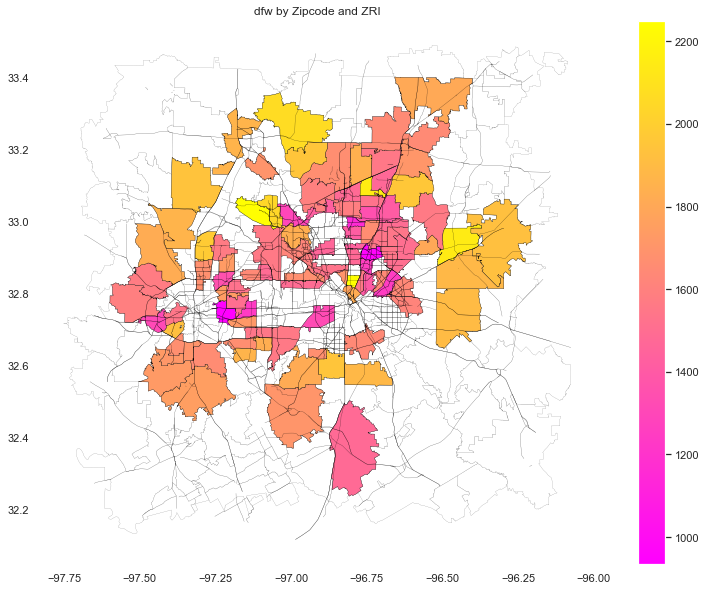

In [417]:
# now let's work on dfw
fig,ax = plt.subplots(figsize=(15, 10))
map_zip_dfw.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='spring', edgecolor='black', linewidth=0.3)
dfw_full_zips.plot(ax=ax, zorder=1, legend=True, color='white', edgecolor='black', linewidth=0.1)
a.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.3, alpha=0.6)
dfw_zip_limit.plot(ax=ax, zorder=1, legend=True, color='white', edgecolor='black', linewidth=0.1)
plt.title('dfw by Zipcode and ZRI')
ax.set(facecolor = "white")
ax.grid(False)
# Looks better, our target zips are just layered over the dfw_zip_limit ones

In [72]:
dfw_zip_limit

,ZCTA5CE10,GEOID10,CLASSFP10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry,x,y
178,75098,75098,B5,G6350,S,85315034,20354151,+33.0121346,-096.5349358,"POLYGON ((-96.60198 33.01127, -96.60061 33.011...",-96.534772,33.011864
179,75101,75101,B5,G6350,S,2130983,0,+32.2700320,-096.7024944,"POLYGON ((-96.71534 32.27898, -96.71297 32.280...",-96.702495,32.270032
182,75104,75104,B5,G6350,S,101138796,643670,+32.5848142,-096.9723118,"POLYGON ((-97.06551 32.54908, -97.06427 32.549...",-96.966166,32.580443
183,75105,75105,B5,G6350,S,133025917,1938590,+32.2630103,-096.3876628,"POLYGON ((-96.45120 32.26837, -96.45046 32.271...",-96.375213,32.266532
186,75114,75114,B5,G6350,S,112014042,1126841,+32.6105754,-096.4442563,"POLYGON ((-96.50103 32.49728, -96.50101 32.497...",-96.445518,32.610170
...,...,...,...,...,...,...,...,...,...,...,...,...
21096,76623,76623,B5,G6350,S,13132338,69989,+32.2111227,-096.7528266,"POLYGON ((-96.79442 32.20779, -96.79322 32.208...",-96.756564,32.210401
21214,76258,76258,B5,G6350,S,231156079,2936204,+33.3710937,-096.9323351,"POLYGON ((-97.03695 33.35815, -97.03508 33.358...",-96.919635,33.371906
21215,76259,76259,B5,G6350,S,146751957,1643657,+33.1987013,-097.3116335,"POLYGON ((-97.40948 33.25598, -97.40939 33.257...",-97.307076,33.200179
21217,76262,76262,B5,G6350,S,117348475,2708728,+33.0093346,-097.2267197,"POLYGON ((-97.30876 32.97259, -97.30859 32.973...",-97.225798,33.009486


In [73]:
fort_worth_zips = [76101, 76102, 76103, 76104, 76105, 76106, 76107, 76108, 76109, 76110, 76111, 76112, 76113, 76114, 76115, 76116, 76118, 76119, 76120, 76121, 76122, 76123, 76124, 76126, 76129, 76130, 76131, 76132, 76133, 76134, 76135, 76136, 76137, 76140, 76147, 76148, 76150, 76155, 76161, 76162, 76163, 76164, 76177, 76178, 76179, 76181, 76185, 76191, 76192, 76193, 76195, 76196, 76197, 76198, 76199]
dallas_zips = [75201, 75202, 75203, 75204, 75205, 75206, 75207, 75208, 75209, 75210, 75211, 75212, 75214, 75215, 75216, 75217, 75218, 75219, 75220, 75221, 75222, 75223, 75224, 75225, 75226, 75227, 75228, 75229, 75230, 75231, 75232, 75233, 75234, 75235, 75236, 75237, 75238, 75240, 75241, 75242, 75243, 75244, 75246, 75247, 75248, 75249, 75250, 75251, 75252, 75253, 75254, 75260, 75261, 75262, 75263, 75264, 75265, 75266, 75267, 75270, 75275, 75277, 75283, 75284, 75285, 75287, 75301, 75303, 75312, 75313, 75315, 75320, 75326, 75336, 75339, 75342, 75354, 75355, 75356, 75357, 75358, 75359, 75360, 75367, 75368, 75370, 75371, 75372, 75373, 75374, 75376, 75378, 75379, 75380, 75381, 75382, 75389, 75390, 75391, 75392, 75393, 75394, 75395, 75397, 75398]
arlington_zips = [76001, 76002, 76003, 76004, 76005, 76006, 76007, 76010, 76011, 76012, 76013, 76014, 76015, 76016, 76017, 76018, 76019, 76094, 76096]
irving_zips = [75014, 75015, 75016, 75017, 75038, 75039, 75059, 75060, 75061, 75062, 75063, 75064]
gp_zips = [75050, 75051, 75052, 75053, 75054]


In [74]:
fort_worth_zips = zips[zips['GEOID10'].isin(fort_worth_zips)]
dallas_zips = zips[zips['GEOID10'].isin(dallas_zips)]
arlington_zips = zips[zips['GEOID10'].isin(arlington_zips)]
irving_zips = zips[zips['GEOID10'].isin(irving_zips)]
gp_zips = zips[zips['GEOID10'].isin(gp_zips)]

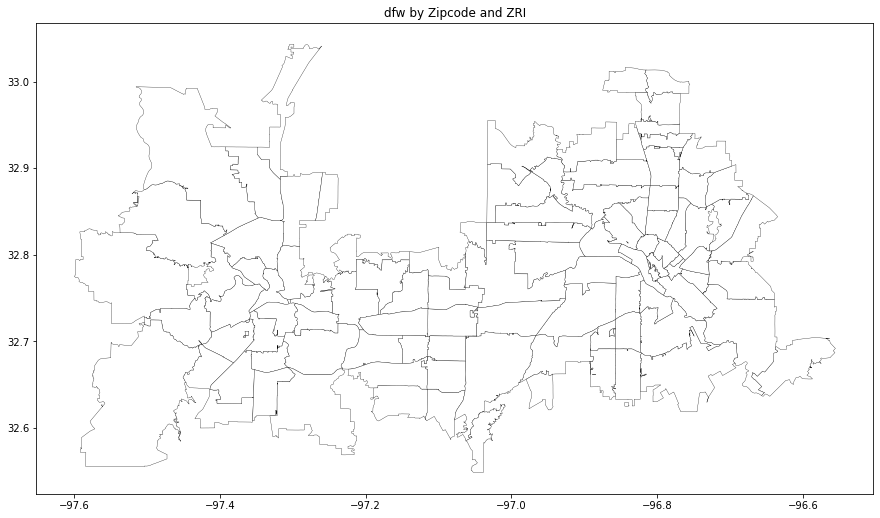

In [75]:
fig,ax = plt.subplots(figsize=(15, 10))
fort_worth_zips.plot(ax=ax, zorder=1, legend=True, color='white', edgecolor='black', linewidth=0.3)
dallas_zips.plot(ax=ax, zorder=1, legend=True, color='white', edgecolor='black', linewidth=0.3)
arlington_zips.plot(ax=ax, zorder=1, legend=True, color='white', edgecolor='black', linewidth=0.3)
irving_zips.plot(ax=ax, zorder=1, legend=True, color='white', edgecolor='black', linewidth=0.3)
gp_zips.plot(ax=ax, zorder=1, legend=True, color='white', edgecolor='black', linewidth=0.3)
plt.title('dfw by Zipcode and ZRI')
ax.set(facecolor = "white")
ax.grid(False)

In [76]:
hydro_dfw = gpd.read_file('/Users/trevorban/Downloads/HydroImp/HydroImp.shp')

<AxesSubplot:>

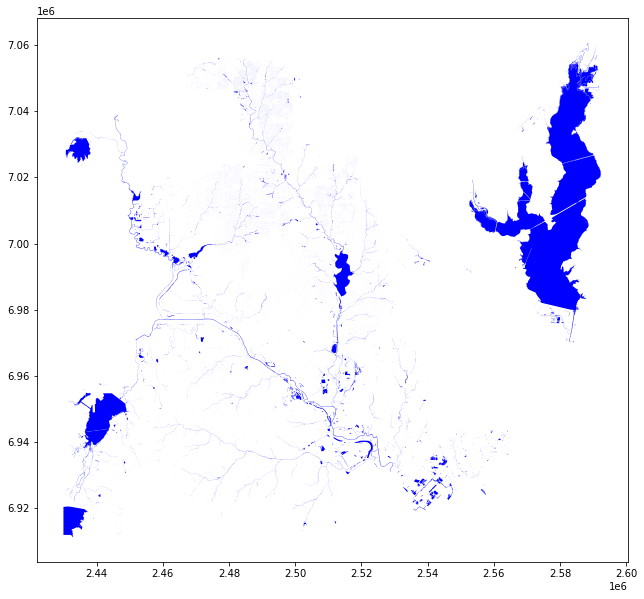

In [77]:
fig,ax = plt.subplots(figsize=(15, 10))
hydro_dfw.plot(ax=ax, zorder=1, legend=True, color='blue')
# coordinates are way off.  Won't layer.  

In [78]:
lakes_dfw = gpd.read_file('/Users/trevorban/Downloads/NAT_LAKES/NAT_LAKES.shp')

<AxesSubplot:>

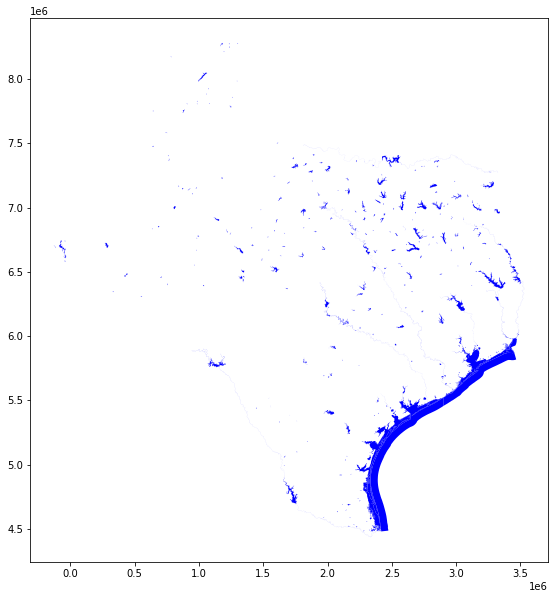

In [79]:
fig,ax = plt.subplots(figsize=(15, 10))
lakes_dfw.plot(ax=ax, zorder=1, legend=True, color='blue')

In [80]:
rivers_dfw = gpd.read_file('/Users/trevorban/Downloads/NAT_NTEXAS_RIVERS/NAT_NTEXAS_RIVERS.shp')

<AxesSubplot:>

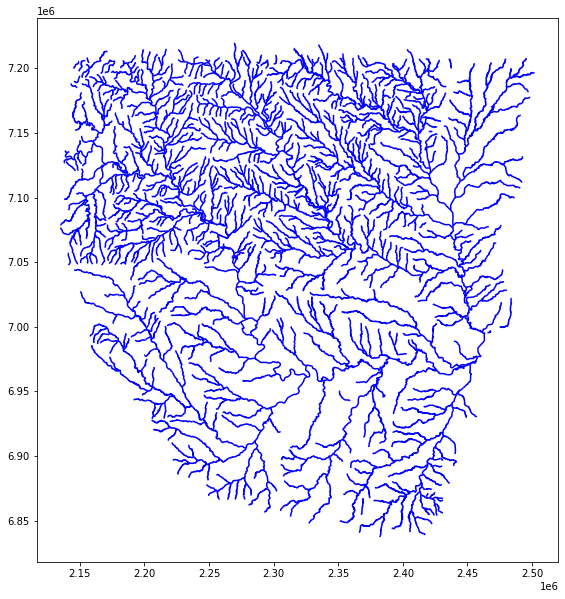

In [82]:
fig,ax = plt.subplots(figsize=(15, 10))
rivers_dfw.plot(ax=ax, zorder=1, legend=True, color='blue')

In [84]:
zips

,ZCTA5CE10,GEOID10,CLASSFP10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry,x,y
0,43451,43451,B5,G6350,S,63484186,157689,+41.3183010,-083.6174935,"POLYGON ((-83.70873 41.32733, -83.70815 41.327...",-83.615185,41.312827
1,43452,43452,B5,G6350,S,121522304,13721730,+41.5157923,-082.9809454,"POLYGON ((-83.08698 41.53780, -83.08256 41.537...",-82.966803,41.515176
2,43456,43456,B5,G6350,S,9320975,1003775,+41.6318300,-082.8393923,"MULTIPOLYGON (((-82.83558 41.71082, -82.83515 ...",-82.822768,41.668369
3,43457,43457,B5,G6350,S,48004681,0,+41.2673301,-083.4274872,"POLYGON ((-83.49650 41.25371, -83.48382 41.253...",-83.427484,41.267330
4,43458,43458,B5,G6350,S,2573816,39915,+41.5304461,-083.2133648,"POLYGON ((-83.22229 41.53102, -83.22228 41.532...",-83.212587,41.531051
...,...,...,...,...,...,...,...,...,...,...,...,...
33139,84044,84044,B5,G6350,S,123283611,69912363,+40.7201095,-112.1549645,"POLYGON ((-112.26022 40.76909, -112.25333 40.7...",-112.155923,40.719797
33140,84045,84045,B5,G6350,S,52780589,105248,+40.3364908,-111.9111905,"MULTIPOLYGON (((-111.92421 40.17034, -111.9240...",-111.911744,40.338452
33141,84046,84046,B5,G6350,S,333205012,4460752,+40.9207693,-109.8310453,"POLYGON ((-110.00072 40.99745, -110.00036 40.9...",-109.822697,40.943719
33142,84047,84047,B5,G6350,S,16172461,0,+40.6152301,-111.8907499,"POLYGON ((-111.92141 40.62772, -111.92134 40.6...",-111.890748,40.615230


In [87]:
tx = zips[zips['GEOID10'].isin(txzips)]

In [89]:
zips

,ZCTA5CE10,GEOID10,CLASSFP10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry,x,y
0,43451,43451,B5,G6350,S,63484186,157689,+41.3183010,-083.6174935,"POLYGON ((-83.70873 41.32733, -83.70815 41.327...",-83.615185,41.312827
1,43452,43452,B5,G6350,S,121522304,13721730,+41.5157923,-082.9809454,"POLYGON ((-83.08698 41.53780, -83.08256 41.537...",-82.966803,41.515176
2,43456,43456,B5,G6350,S,9320975,1003775,+41.6318300,-082.8393923,"MULTIPOLYGON (((-82.83558 41.71082, -82.83515 ...",-82.822768,41.668369
3,43457,43457,B5,G6350,S,48004681,0,+41.2673301,-083.4274872,"POLYGON ((-83.49650 41.25371, -83.48382 41.253...",-83.427484,41.267330
4,43458,43458,B5,G6350,S,2573816,39915,+41.5304461,-083.2133648,"POLYGON ((-83.22229 41.53102, -83.22228 41.532...",-83.212587,41.531051
...,...,...,...,...,...,...,...,...,...,...,...,...
33139,84044,84044,B5,G6350,S,123283611,69912363,+40.7201095,-112.1549645,"POLYGON ((-112.26022 40.76909, -112.25333 40.7...",-112.155923,40.719797
33140,84045,84045,B5,G6350,S,52780589,105248,+40.3364908,-111.9111905,"MULTIPOLYGON (((-111.92421 40.17034, -111.9240...",-111.911744,40.338452
33141,84046,84046,B5,G6350,S,333205012,4460752,+40.9207693,-109.8310453,"POLYGON ((-110.00072 40.99745, -110.00036 40.9...",-109.822697,40.943719
33142,84047,84047,B5,G6350,S,16172461,0,+40.6152301,-111.8907499,"POLYGON ((-111.92141 40.62772, -111.92134 40.6...",-111.890748,40.615230


In [102]:
txs = pd.read_csv('/Users/trevorban/Downloads/tx (1) - Texas.csv')

In [114]:
txs = txs.drop(columns='Unnamed: 0')

In [119]:
txs = txs.dropna(how='any')

In [121]:
txs['Unnamed: 1'] = txs['Unnamed: 1'].astype(int)

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [131]:
zips['GEOID10']

0        43451
1        43452
2        43456
3        43457
4        43458
         ...  
33139    84044
33140    84045
33141    84046
33142    84047
33143    84049
Name: GEOID10, Length: 33144, dtype: int64

In [132]:
tx = zips[zips['GEOID10'].isin(txs['Unnamed: 1'])]

In [133]:
tx

,ZCTA5CE10,GEOID10,CLASSFP10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry,x,y
178,75098,75098,B5,G6350,S,85315034,20354151,+33.0121346,-096.5349358,"POLYGON ((-96.60198 33.01127, -96.60061 33.011...",-96.534772,33.011864
179,75101,75101,B5,G6350,S,2130983,0,+32.2700320,-096.7024944,"POLYGON ((-96.71534 32.27898, -96.71297 32.280...",-96.702495,32.270032
180,75102,75102,B5,G6350,S,157209930,1547624,+32.0579379,-096.6325473,"POLYGON ((-96.72234 32.04348, -96.72231 32.043...",-96.642232,32.066325
181,75103,75103,B5,G6350,S,516408848,8411316,+32.5169296,-095.8835471,"POLYGON ((-96.07580 32.56362, -96.07264 32.562...",-95.882343,32.511927
182,75104,75104,B5,G6350,S,101138796,643670,+32.5848142,-096.9723118,"POLYGON ((-97.06551 32.54908, -97.06427 32.549...",-96.966166,32.580443
...,...,...,...,...,...,...,...,...,...,...,...,...
31230,79201,79201,B5,G6350,S,2228769010,44016213,+34.4377661,-100.2809616,"POLYGON ((-100.82980 34.27853, -100.82327 34.2...",-100.280899,34.437150
31231,79220,79220,B5,G6350,S,498146442,1831759,+33.7535011,-100.7946321,"POLYGON ((-100.98365 33.70898, -100.98364 33.7...",-100.786413,33.757782
31232,79225,79225,B5,G6350,S,382829585,423205,+34.2559310,-099.5152041,"POLYGON ((-99.60866 34.09091, -99.60864 34.091...",-99.514965,34.256378
31881,75480,75480,B5,G6350,S,83866562,10602695,+33.0245846,-095.1971335,"POLYGON ((-95.25070 33.03933, -95.24901 33.041...",-95.194121,33.024733


<AxesSubplot:>

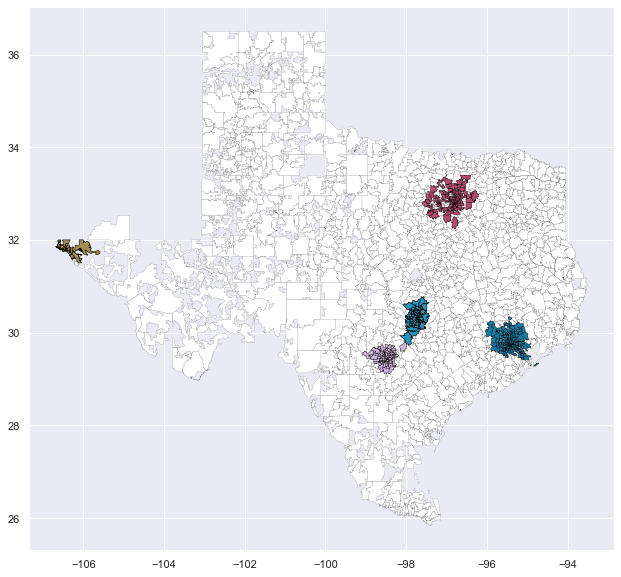

In [391]:
colors = ['#2596be', '#a48c4c', '#127ea6', '#b6496d', '#cdb4db']

fig,ax = plt.subplots(figsize=(15, 10))
tx.plot(ax=ax, zorder=1, legend=True, color='white', edgecolor='black', linewidth=.1)
# dfw_full_zips.plot(ax=ax, zorder=2, legend=True, color='blue', edgecolor='black', linewidth=0.3)
# dfw_zip_limit.plot(ax=ax, zorder=2, legend=True, color='blue', edgecolor='black', linewidth=0.3)

map_zip_austin.plot(ax=ax, zorder=2, legend=True, color=colors[0], edgecolor='black', linewidth=0.5)
austin_half_zips.plot(ax=ax, zorder=2, legend=True, color=colors[0], edgecolor='black', linewidth=0.5)

map_zip_el_paso.plot(ax=ax, zorder=2, legend=True, color=colors[1], edgecolor='black', linewidth=0.5)
elpaso_half_zips.plot(ax=ax, zorder=2, legend=True, color=colors[1], edgecolor='black', linewidth=0.5)

map_zip_houston.plot(ax=ax, zorder=2, color=colors[2], legend=True, edgecolor='black', linewidth=0.3)
houston_half_zips.plot(ax=ax, zorder=2, legend=True, color=colors[2], edgecolor='black', linewidth=0.3)

map_zip_dfw.plot(ax=ax, zorder=3, color=colors[3], edgecolor='black', linewidth=0.3)
dfw_half_zips.plot(ax=ax, zorder=3, legend=True, color=colors[3], edgecolor='black', linewidth=0.3)

map_zip_san_antonio.plot(ax=ax, zorder=2, color=colors[4], edgecolor='black', linewidth=0.3)
sanan_half_zips.plot(ax=ax, zorder=1, legend=True, color=colors[4], edgecolor='black', linewidth=0.3)


In [137]:
zips

,ZCTA5CE10,GEOID10,CLASSFP10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry,x,y
0,43451,43451,B5,G6350,S,63484186,157689,+41.3183010,-083.6174935,"POLYGON ((-83.70873 41.32733, -83.70815 41.327...",-83.615185,41.312827
1,43452,43452,B5,G6350,S,121522304,13721730,+41.5157923,-082.9809454,"POLYGON ((-83.08698 41.53780, -83.08256 41.537...",-82.966803,41.515176
2,43456,43456,B5,G6350,S,9320975,1003775,+41.6318300,-082.8393923,"MULTIPOLYGON (((-82.83558 41.71082, -82.83515 ...",-82.822768,41.668369
3,43457,43457,B5,G6350,S,48004681,0,+41.2673301,-083.4274872,"POLYGON ((-83.49650 41.25371, -83.48382 41.253...",-83.427484,41.267330
4,43458,43458,B5,G6350,S,2573816,39915,+41.5304461,-083.2133648,"POLYGON ((-83.22229 41.53102, -83.22228 41.532...",-83.212587,41.531051
...,...,...,...,...,...,...,...,...,...,...,...,...
33139,84044,84044,B5,G6350,S,123283611,69912363,+40.7201095,-112.1549645,"POLYGON ((-112.26022 40.76909, -112.25333 40.7...",-112.155923,40.719797
33140,84045,84045,B5,G6350,S,52780589,105248,+40.3364908,-111.9111905,"MULTIPOLYGON (((-111.92421 40.17034, -111.9240...",-111.911744,40.338452
33141,84046,84046,B5,G6350,S,333205012,4460752,+40.9207693,-109.8310453,"POLYGON ((-110.00072 40.99745, -110.00036 40.9...",-109.822697,40.943719
33142,84047,84047,B5,G6350,S,16172461,0,+40.6152301,-111.8907499,"POLYGON ((-111.92141 40.62772, -111.92134 40.6...",-111.890748,40.615230


In [138]:
texs = pd.read_csv('/Users/trevorban/Downloads/usa_zipcode_of_tx-1560j.csv')

In [141]:
texs = texs[['zip']]

In [157]:
texs = texs.dropna(how='any')
texs

,zip
0,76621
1,79311
2,79601
3,79602
4,79603
...,...
2383,78164
2384,78076
2385,75980
2386,76890


In [160]:
texs = texs.loc[:2388, :]

In [161]:
texs['zip'] = texs['zip'].astype(int)

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [163]:
tx = zips[zips['GEOID10'].isin(texs['zip'])]

In [164]:
tx

,ZCTA5CE10,GEOID10,CLASSFP10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry,x,y
178,75098,75098,B5,G6350,S,85315034,20354151,+33.0121346,-096.5349358,"POLYGON ((-96.60198 33.01127, -96.60061 33.011...",-96.534772,33.011864
179,75101,75101,B5,G6350,S,2130983,0,+32.2700320,-096.7024944,"POLYGON ((-96.71534 32.27898, -96.71297 32.280...",-96.702495,32.270032
180,75102,75102,B5,G6350,S,157209930,1547624,+32.0579379,-096.6325473,"POLYGON ((-96.72234 32.04348, -96.72231 32.043...",-96.642232,32.066325
181,75103,75103,B5,G6350,S,516408848,8411316,+32.5169296,-095.8835471,"POLYGON ((-96.07580 32.56362, -96.07264 32.562...",-95.882343,32.511927
182,75104,75104,B5,G6350,S,101138796,643670,+32.5848142,-096.9723118,"POLYGON ((-97.06551 32.54908, -97.06427 32.549...",-96.966166,32.580443
...,...,...,...,...,...,...,...,...,...,...,...,...
31230,79201,79201,B5,G6350,S,2228769010,44016213,+34.4377661,-100.2809616,"POLYGON ((-100.82980 34.27853, -100.82327 34.2...",-100.280899,34.437150
31231,79220,79220,B5,G6350,S,498146442,1831759,+33.7535011,-100.7946321,"POLYGON ((-100.98365 33.70898, -100.98364 33.7...",-100.786413,33.757782
31232,79225,79225,B5,G6350,S,382829585,423205,+34.2559310,-099.5152041,"POLYGON ((-99.60866 34.09091, -99.60864 34.091...",-99.514965,34.256378
31881,75480,75480,B5,G6350,S,83866562,10602695,+33.0245846,-095.1971335,"POLYGON ((-95.25070 33.03933, -95.24901 33.041...",-95.194121,33.024733


<AxesSubplot:>

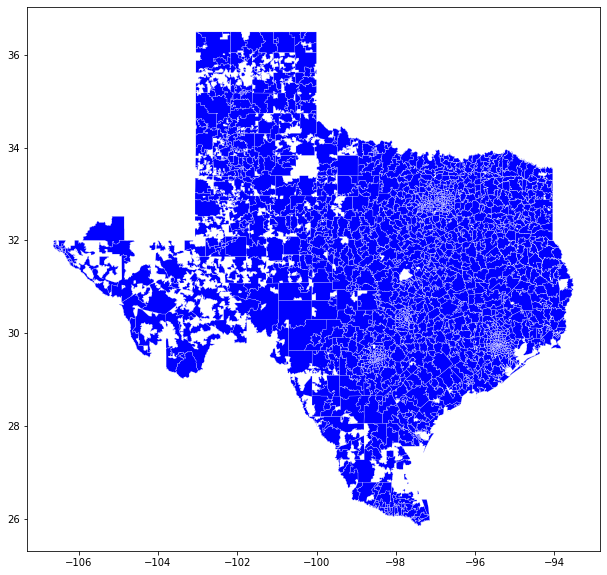

In [165]:
fig,ax = plt.subplots(figsize=(15, 10))
tx.plot(ax=ax, zorder=1, legend=True, color='blue', edgecolor='white', linewidth=.2)

## Mapping zri across time

In [212]:
txdf = pd.read_csv('/Users/trevorban/Desktop/zri-data/complete/merged_texas_data.csv').drop(columns='Unnamed: 0')

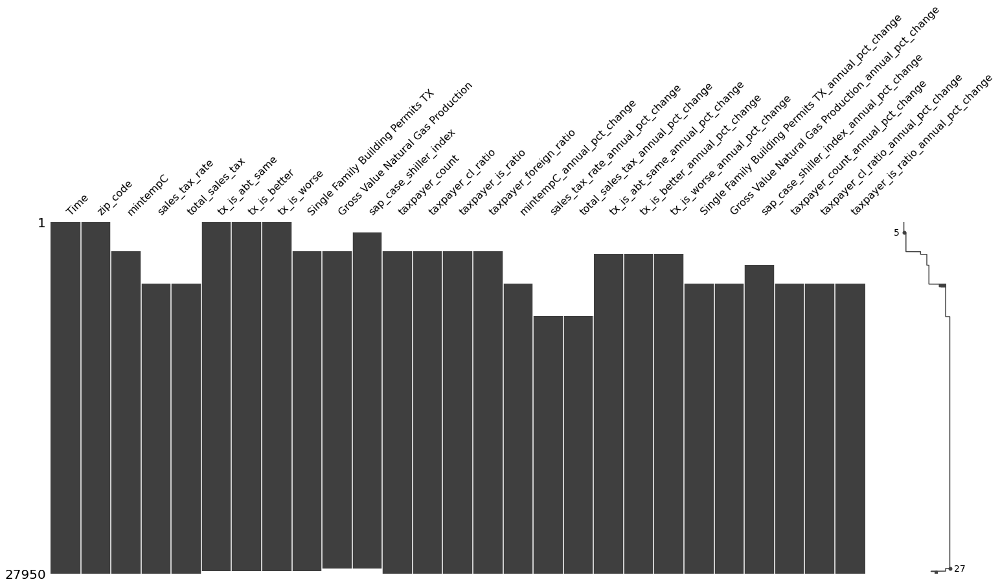

In [213]:
msno.matrix(txdf)
plt.show()

In [214]:
df = txdf.dropna(how='any')

In [215]:
target_raw = pd.read_csv('/Users/trevorban/Desktop/zri-data/complete/target.csv').drop(columns='Unnamed: 0')
target = target_raw.copy()

In [216]:
df = df.merge(target, how='inner', on=['zip_code', 'Time'])

In [217]:
df = df.dropna(how='any')

In [280]:
df

,Time,zip_code,mintempC,sales_tax_rate,total_sales_tax,tx_is_abt_same,tx_is_better,tx_is_worse,Single Family Building Permits TX,Gross Value Natural Gas Production,sap_case_shiller_index,taxpayer_count,taxpayer_cl_ratio,taxpayer_is_ratio,taxpayer_foreign_ratio,mintempC_annual_pct_change,sales_tax_rate_annual_pct_change,total_sales_tax_annual_pct_change,tx_is_abt_same_annual_pct_change,tx_is_better_annual_pct_change,tx_is_worse_annual_pct_change,Single Family Building Permits TX_annual_pct_change,Gross Value Natural Gas Production_annual_pct_change,sap_case_shiller_index_annual_pct_change,taxpayer_count_annual_pct_change,taxpayer_cl_ratio_annual_pct_change,taxpayer_is_ratio_annual_pct_change,City,State,zori_ssa,zori_ssa_diff
30,2014-01-01,78252,4.935484,1.250,22890777.55,48.0,22.0,35.0,7395.0,3667.33,159.381,0.0,0.000000,0.000000,0.000000,-0.422642,0.111111,0.244854,0.116279,-0.043478,0.029412,0.121134,0.361376,0.104397,-1.000000,0.354167,0.375000,San Antonio,TX,1224.0,22.0
215,2014-02-01,75098,4.035714,2.000,855507.05,43.0,25.0,31.0,7552.0,3918.88,159.885,3.0,0.000000,1.000000,0.000000,-0.379121,0.000000,0.139570,0.000000,0.086957,-0.088235,0.136665,0.586360,0.101387,2.000000,0.354167,0.000000,Dallas-Fort Worth,TX,1152.0,29.0
216,2014-02-01,75104,4.035714,1.875,1557442.62,43.0,25.0,31.0,7552.0,3918.88,159.885,0.0,0.000000,0.000000,0.000000,-0.379121,-0.062500,-0.015353,0.000000,0.086957,-0.088235,0.136665,0.586360,0.101387,-1.000000,0.354167,-1.000000,Dallas-Fort Worth,TX,1221.0,225.0
217,2014-02-01,76179,4.035714,1.000,13416181.08,43.0,25.0,31.0,7552.0,3918.88,159.885,1.0,0.000000,1.000000,0.000000,-0.379121,0.000000,0.074357,0.000000,0.086957,-0.088235,0.136665,0.586360,0.101387,-0.750000,-1.000000,1.000000,Dallas-Fort Worth,TX,1234.0,-18.0
218,2014-02-01,75243,4.035714,1.000,26427421.21,43.0,25.0,31.0,7552.0,3918.88,159.885,0.0,0.000000,0.000000,0.000000,-0.379121,0.000000,0.054459,0.000000,0.086957,-0.088235,0.136665,0.586360,0.101387,-1.000000,0.354167,-1.000000,Dallas-Fort Worth,TX,646.0,-317.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19990,2021-06-01,78634,22.700000,2.000,770825.18,49.0,23.0,25.0,15454.0,3008.66,260.866,14.0,0.428571,0.428571,0.000000,-0.036775,0.000000,0.213200,0.139535,-0.041667,-0.193548,0.284408,1.704559,0.186105,-0.263158,-0.095238,0.163265,Austin,TX,1500.0,-389.0
19991,2021-06-01,78759,22.700000,1.000,22533954.34,49.0,23.0,25.0,15454.0,3008.66,260.866,10.0,0.400000,0.300000,0.000000,-0.036775,0.000000,0.383116,0.139535,-0.041667,-0.193548,0.284408,1.704559,0.186105,-0.285714,-0.200000,-0.160000,Austin,TX,1346.0,-190.0
19992,2021-06-01,78681,22.700000,2.000,9150916.03,49.0,23.0,25.0,15454.0,3008.66,260.866,18.0,0.722222,0.166667,0.055556,-0.036775,0.000000,0.341611,0.139535,-0.041667,-0.193548,0.284408,1.704559,0.186105,-0.142857,0.378788,-0.562500,Austin,TX,1731.0,-137.0
19993,2021-06-01,78641,22.700000,1.000,753034.24,49.0,23.0,25.0,15454.0,3008.66,260.866,29.0,0.482759,0.413793,0.000000,-0.036775,0.000000,0.435226,0.139535,-0.041667,-0.193548,0.284408,1.704559,0.186105,0.380952,-0.078370,-0.034483,Austin,TX,1790.0,65.0


In [259]:
df['City'].unique()

array(['San Antonio', 'Dallas-Fort Worth', 'Houston', 'Austin', 'El Paso'],
      dtype=object)

In [209]:
import pandas as pd

import plotly

import plotly.graph_objs as go

import plotly.offline as offline

from plotly.graph_objs import *

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

init_notebook_mode(connected=True)

In [328]:
df['City'].unique()

array(['San Antonio', 'Dallas-Fort Worth', 'Houston', 'Austin', 'El Paso'],
      dtype=object)

In [336]:
import plotly.express as px

fig = px.scatter(df, x="zip_code", y="zori_ssa", animation_frame="Time", animation_group="zip_code",
           size="taxpayer_count", hover_name="zip_code", color='zip_code',
           log_x=True, size_max=80, range_x=[75002,79936], range_y=[595,2746])

fig.show()

In [292]:
new = df.groupby(['City', 'Time']).mean().reset_index()

In [294]:
new['City'].unique()

array(['Austin', 'Dallas-Fort Worth', 'El Paso', 'Houston', 'San Antonio'],
      dtype=object)

In [295]:
austin = new[new['City']=='Austin']
sanan = new[new['City']=='San Antonio']
dfw = new[new['City']=='Dallas-Fort Worth']
houston = new[new['City']=='Houston']
elpaso = new[new['City']=='El Paso']

In [297]:
elpaso

,City,Time,zip_code,mintempC,sales_tax_rate,total_sales_tax,tx_is_abt_same,tx_is_better,tx_is_worse,Single Family Building Permits TX,Gross Value Natural Gas Production,sap_case_shiller_index,taxpayer_count,taxpayer_cl_ratio,taxpayer_is_ratio,taxpayer_foreign_ratio,mintempC_annual_pct_change,sales_tax_rate_annual_pct_change,total_sales_tax_annual_pct_change,tx_is_abt_same_annual_pct_change,tx_is_better_annual_pct_change,tx_is_worse_annual_pct_change,Single Family Building Permits TX_annual_pct_change,Gross Value Natural Gas Production_annual_pct_change,sap_case_shiller_index_annual_pct_change,taxpayer_count_annual_pct_change,taxpayer_cl_ratio_annual_pct_change,taxpayer_is_ratio_annual_pct_change,zori_ssa,zori_ssa_diff
178,El Paso,2014-02-01,79912.0,8.071429,1.0,8674190.83,43.0,25.0,31.0,7552.0,3918.88,159.885,6.0,0.500000,0.333333,0.0,0.765625,0.0,0.020089,0.000000,0.086957,-0.088235,0.136665,0.586360,0.101387,0.500000,0.000000,-0.333333,1180.0,-38.0
179,El Paso,2014-03-01,79924.0,10.032258,1.0,5410461.83,43.0,25.0,31.0,8579.0,3847.20,161.203,9.0,0.555556,0.166667,0.0,-0.006390,0.0,-0.019289,0.000000,0.086957,-0.088235,0.148307,0.375528,0.089438,2.750000,0.388889,-0.722222,1034.5,-122.5
180,El Paso,2014-04-01,79924.0,12.800000,1.0,5906385.08,43.0,25.0,31.0,9373.0,3681.81,162.983,10.0,0.404040,0.257576,0.0,0.052055,0.0,0.050533,0.000000,0.086957,-0.088235,0.091153,0.217618,0.079515,0.550000,1.020202,-0.494949,1036.0,-132.5
181,El Paso,2014-05-01,79924.0,16.161290,1.0,7278095.68,43.0,25.0,31.0,9067.0,3871.69,164.697,6.0,0.250000,0.375000,0.0,0.024540,0.0,0.011076,0.000000,0.086957,-0.088235,0.121044,0.194089,0.070365,0.200000,0.250000,-0.270833,1037.0,-143.5
182,El Paso,2014-06-01,79924.0,23.866667,1.0,6204289.49,42.0,27.0,29.0,9250.0,3748.18,166.224,5.0,0.400000,0.300000,0.1,0.001399,0.0,0.039252,-0.045455,0.080000,-0.033333,0.198342,0.227097,0.062548,0.250000,-0.466667,0.887500,1038.5,-153.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
262,El Paso,2021-02-01,79924.0,7.428571,1.0,10970053.83,49.0,18.0,29.0,12019.0,4996.12,239.210,18.5,0.388112,0.463287,0.0,0.099125,0.0,-0.006691,0.289474,-0.560976,0.526316,0.062312,3.485733,0.121462,0.218045,-0.028971,0.379768,1191.0,-255.0
263,El Paso,2021-03-01,79924.0,10.774194,1.0,8069558.17,49.0,22.0,28.0,17013.0,3228.00,243.937,18.0,0.412500,0.431250,0.0,-0.127937,0.0,0.046794,0.289474,-0.463415,0.473684,0.419643,2.426424,0.133099,0.200000,2.187500,-0.015625,1198.5,-256.0
264,El Paso,2021-04-01,79924.0,14.800000,1.0,7616442.27,53.0,21.0,23.0,16153.0,3017.95,249.611,26.0,0.412500,0.403125,0.0,-0.104839,0.0,0.090266,0.558824,-0.250000,-0.342857,0.719319,2.598667,0.148450,0.569231,-0.074091,0.679167,1206.5,-257.0
265,El Paso,2021-05-01,79924.0,19.645161,1.0,10975509.18,53.0,21.0,23.0,15793.0,3419.56,255.298,18.5,0.392857,0.480655,0.0,-0.054348,0.0,0.365210,0.558824,-0.250000,-0.342857,0.625965,1.813480,0.167829,0.588889,1.488095,0.801711,1213.5,-258.5


In [303]:
df['zori_ssa'].min()

595.0

In [309]:
new['Time'] = pd.to_datetime(new['Time'])

<AxesSubplot:xlabel='Time', ylabel='zori_ssa'>

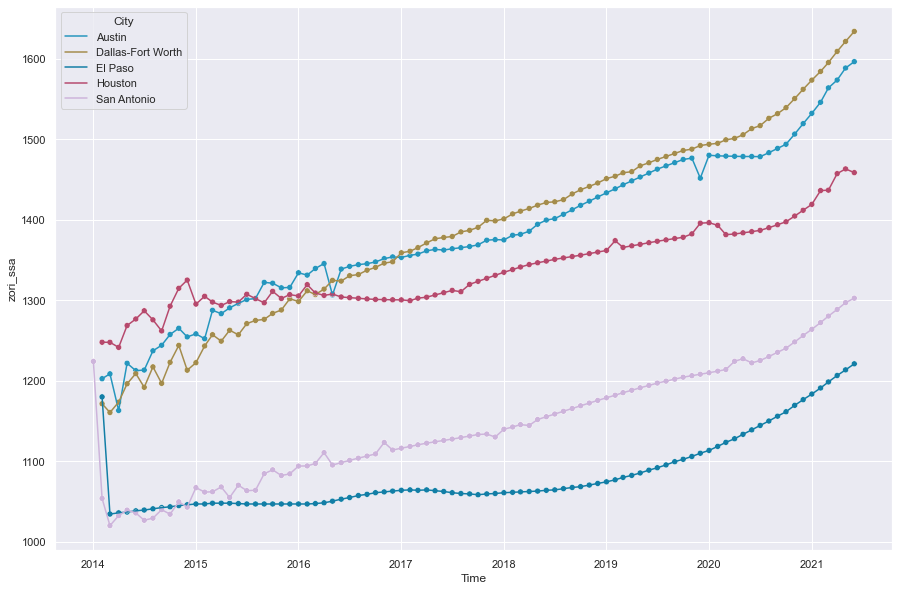

In [388]:
sns.set_theme()
fig,ax = plt.subplots(figsize=(15, 10))
sns.lineplot(data=new, x="Time", y="zori_ssa", hue="City", palette=colors)
sns.scatterplot(data=new, x="Time", y="zori_ssa", hue="City", legend=False, palette=colors)

In [337]:
df

,Time,zip_code,mintempC,sales_tax_rate,total_sales_tax,tx_is_abt_same,tx_is_better,tx_is_worse,Single Family Building Permits TX,Gross Value Natural Gas Production,sap_case_shiller_index,taxpayer_count,taxpayer_cl_ratio,taxpayer_is_ratio,taxpayer_foreign_ratio,mintempC_annual_pct_change,sales_tax_rate_annual_pct_change,total_sales_tax_annual_pct_change,tx_is_abt_same_annual_pct_change,tx_is_better_annual_pct_change,tx_is_worse_annual_pct_change,Single Family Building Permits TX_annual_pct_change,Gross Value Natural Gas Production_annual_pct_change,sap_case_shiller_index_annual_pct_change,taxpayer_count_annual_pct_change,taxpayer_cl_ratio_annual_pct_change,taxpayer_is_ratio_annual_pct_change,City,State,zori_ssa,zori_ssa_diff
30,2014-01-01,78252,4.935484,1.250,22890777.55,48.0,22.0,35.0,7395.0,3667.33,159.381,0.0,0.000000,0.000000,0.000000,-0.422642,0.111111,0.244854,0.116279,-0.043478,0.029412,0.121134,0.361376,0.104397,-1.000000,0.354167,0.375000,San Antonio,TX,1224.0,22.0
215,2014-02-01,75098,4.035714,2.000,855507.05,43.0,25.0,31.0,7552.0,3918.88,159.885,3.0,0.000000,1.000000,0.000000,-0.379121,0.000000,0.139570,0.000000,0.086957,-0.088235,0.136665,0.586360,0.101387,2.000000,0.354167,0.000000,Dallas-Fort Worth,TX,1152.0,29.0
216,2014-02-01,75104,4.035714,1.875,1557442.62,43.0,25.0,31.0,7552.0,3918.88,159.885,0.0,0.000000,0.000000,0.000000,-0.379121,-0.062500,-0.015353,0.000000,0.086957,-0.088235,0.136665,0.586360,0.101387,-1.000000,0.354167,-1.000000,Dallas-Fort Worth,TX,1221.0,225.0
217,2014-02-01,76179,4.035714,1.000,13416181.08,43.0,25.0,31.0,7552.0,3918.88,159.885,1.0,0.000000,1.000000,0.000000,-0.379121,0.000000,0.074357,0.000000,0.086957,-0.088235,0.136665,0.586360,0.101387,-0.750000,-1.000000,1.000000,Dallas-Fort Worth,TX,1234.0,-18.0
218,2014-02-01,75243,4.035714,1.000,26427421.21,43.0,25.0,31.0,7552.0,3918.88,159.885,0.0,0.000000,0.000000,0.000000,-0.379121,0.000000,0.054459,0.000000,0.086957,-0.088235,0.136665,0.586360,0.101387,-1.000000,0.354167,-1.000000,Dallas-Fort Worth,TX,646.0,-317.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19990,2021-06-01,78634,22.700000,2.000,770825.18,49.0,23.0,25.0,15454.0,3008.66,260.866,14.0,0.428571,0.428571,0.000000,-0.036775,0.000000,0.213200,0.139535,-0.041667,-0.193548,0.284408,1.704559,0.186105,-0.263158,-0.095238,0.163265,Austin,TX,1500.0,-389.0
19991,2021-06-01,78759,22.700000,1.000,22533954.34,49.0,23.0,25.0,15454.0,3008.66,260.866,10.0,0.400000,0.300000,0.000000,-0.036775,0.000000,0.383116,0.139535,-0.041667,-0.193548,0.284408,1.704559,0.186105,-0.285714,-0.200000,-0.160000,Austin,TX,1346.0,-190.0
19992,2021-06-01,78681,22.700000,2.000,9150916.03,49.0,23.0,25.0,15454.0,3008.66,260.866,18.0,0.722222,0.166667,0.055556,-0.036775,0.000000,0.341611,0.139535,-0.041667,-0.193548,0.284408,1.704559,0.186105,-0.142857,0.378788,-0.562500,Austin,TX,1731.0,-137.0
19993,2021-06-01,78641,22.700000,1.000,753034.24,49.0,23.0,25.0,15454.0,3008.66,260.866,29.0,0.482759,0.413793,0.000000,-0.036775,0.000000,0.435226,0.139535,-0.041667,-0.193548,0.284408,1.704559,0.186105,0.380952,-0.078370,-0.034483,Austin,TX,1790.0,65.0


In [340]:
merged = pd.read_csv('/Users/trevorban/Downloads/merged_acs_data.csv').drop(columns='Unnamed: 0')

In [342]:
merged['Time'] = pd.to_datetime(merged['Time'])

<AxesSubplot:>

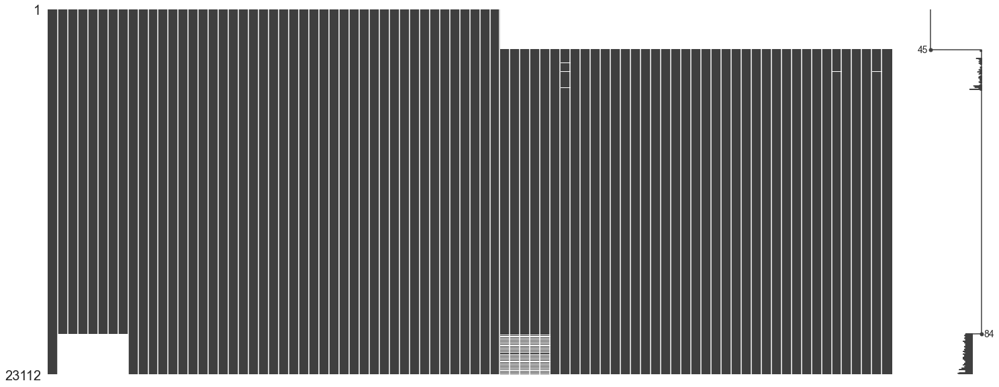

In [345]:
msno.matrix(merged)

In [346]:
merged.shape

(23112, 84)

In [348]:
d = merged.dropna(how='any')

In [370]:
d.Time

2568    2012-01-01
2569    2012-02-01
2570    2012-03-01
2571    2012-04-01
2572    2012-05-01
           ...    
20539   2018-08-01
20540   2018-09-01
20541   2018-10-01
20542   2018-11-01
20543   2018-12-01
Name: Time, Length: 17920, dtype: datetime64[ns]

In [359]:
d['median_household_income']

58383

In [375]:
d.groupby(['Time', 'zip_code']).mean()

white_pop  black_pop  hispanic_pop  \
Time       zip_code                                       
2012-01-01 75002.0     43138.0     6538.0        7722.0   
           75013.0     20302.0      999.0        1690.0   
           75019.0     25892.0     1794.0        3880.0   
           75023.0     28371.0     3929.0        7318.0   
           75024.0     19971.0     2541.0        2483.0   
...                        ...        ...           ...   
2018-12-01 78757.0     17089.0      266.0        6043.0   
           78758.0     17571.0     3618.0       22404.0   
           78759.0     29614.0     1527.0        5584.0   
           79912.0     17942.0     1456.0       56560.0   
           79936.0     10151.0     2546.0       97470.0   

                     female_female_households  children  high_school_diploma  \
Time       zip_code                                                            
2012-01-01 75002.0                       15.0   20201.0               5054.0   
           75013.0                       21.0    9875.0               1471.0   
           75019.0                        6.0   11727.0               2514.0   
           75023.0                       52.0   11814.0               4595.0   
           75024.0                        7.0   10087.0               1779.0   
...                                       ...       ...                  ...   
2018-12-01 78757.0                       68.0    5136.0               2108.0   
           78758.0                       62.0   10083.0               6776.0   
           78759.0                       88.0    7548.0               2579.0   
           79912.0                       57.0   20926.0               6074.0   
           79936.0                       92.0   29933.0              12887.0   

                     armed_forces  driving_alone_population  \
Time       zip_code                                           
2012-01-01 75002.0            7.0                     26690   
           75013.0            8.0                     11072   
           75019.0            0.0                     17113   
           75023.0           67.0                     19689   
           75024.0           59.0                     17422   
...                           ...                       ...   
2018-12-01 78757.0            0.0                     10593   
           78758.0            0.0                     21029   
           78759.0           35.0                     19245   
           79912.0          626.0                     30180   
           79936.0         1358.0                     44108   

                     housing_units_built_1940_to_1949  female_45_to_49  \
Time       zip_code                                                      
2012-01-01 75002.0                                 52             3031   
           75013.0                                  0             1294   
           75019.0                                 59             2302   
           75023.0                                 67             2041   
           75024.0                                 65             1559   
...                                               ...              ...   
2018-12-01 78757.0                                576              750   
           78758.0                                 93             1145   
           78759.0                                  7             1371   
           79912.0                                212             2494   
           79936.0                                237             3789   

                     female_75_to_79  motorcycle_population  \
Time       zip_code                                           
2012-01-01 75002.0               344                     74   
           75013.0               154                     75   
           75019.0               167                     76   
           75023.0               301                     64   
           75024.0               169               

In [377]:
sns.lineplot(d, x='Time', y='median_household_income', hue='zip_code')

ValueError: Could not interpret value `median_household_income` for parameter `y`

In [366]:
d.median_household_income[2568]

58383

In [387]:
colors = ['#2596be', '#a48c4c', '#127ea6', '#b6496d', '#cdb4db']

In [ ]:
, '#d1bf74'